# <center> DATA SCIENCE PROJECT ON "CONCRETE COMPRESSIVE STRENGTH" 

# <center> BUSSINESS CASE: BASED ON CONCRETE CONSTITUENTS COMPOSITIONS AND AGE OF THE MIX  WE NEED TO PREDICT THE FUTURE STRENGTH OF A CONCRETE MIX 

# Problem Stement 

- Task 1:- Prepare a complete data analysis report on the concrete data.
- Task 2:- Create a machine learning model which can predict the future strength of a concrete mix, based on its constituents’ composition and also the age of the mix.
- Create a report stating the performance of multiple models on this data and suggest the best model for production.

# Approch: 
- The classical machine learning tasks like Data Exploration, Data Cleaning, Feature Engineering, Model Building and Model Testing. Trying out different machine learning algorithms that’s best fit for the above case.

# Results:
- we have to build a solution that should able to predict the compressive strength of the concrete and age of the mix.

## Dataset Description

- Concrete as a building block of most construction is the most important material in civil engineering. 
- The concrete compressive strength is a highly nonlinear function of age and ingredients. These ingredients include cement, blast furnace slag, fly ash, water, superplasticizer, coarse aggregate, and fine aggregate.
- The actual concrete compressive strength (MPa) for a given mixture under a specific age (days) was determined from the laboratory. 
- Data is in raw form (not scaled).The data has 8 quantitative input variables, and 1 quantitative output variable, and 1030 instances (observations).


## Attribute Information:

- Given are the variable name, variable type, the measurement unit and a brief description. The concrete compressive strength determination is the objective of the regression task. The order of this listing corresponds to the order of numerals along the rows of the database.

- Cement (component 1) -- quantitative -- kg in a m3 mixture -- Input Variable
- Blast Furnace Slag (component 2) -- quantitative -- kg in a m3 mixture -- Input Variable
- Fly Ash (component 3) -- quantitative -- kg in a m3 mixture -- Input Variable
- Water (component 4) -- quantitative -- kg in a m3 mixture -- Input Variable
- Superplasticizer (component 5) -- quantitative -- kg in a m3 mixture -- Input Variable
- Coarse Aggregate (component 6) -- quantitative -- kg in a m3 mixture -- Input Variable
- Fine Aggregate (component 7) -- quantitative -- kg in a m3 mixture -- Input Variable
- Age -- quantitative -- Day (1~365) -- Input Variable
- Concrete compressive strength -- quantitative -- MPa -- Output Variable


#### Importing the necessecery libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")

#### Importing the dataset

In [2]:
data = pd.read_csv('concrete.csv') 
data

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77


# DOMAIN ANALYSIS

In [3]:
# checking all the columns present in the dataset
data.columns

Index(['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg',
       'fineagg', 'age', 'strength'],
      dtype='object')

## What is a concrete?

- Concrete is a mixture of cement, air, water, sand, and gravel–it’s as simple as that!

- The typical concrete mix is made up of roughly 10% cement, 20% air and water, 30% sand, and 40% gravel. This is called the 10-20-30-40 Rule–though proportions may vary depending on the type of cement and other factors.

### Cement
-------
- Cement is a binder used for construction that sets, hardens, and adheres to other materials to bind them together. It is seldom used on its own but rather to bind sand and gravel together. Cement mixed with fine aggregate produces mortar for masonry or with sand and gravel produces concrete. Concrete is the most widely used material in existence and is behind only water as the planet’s most-consumed resource.

### Blast Furnace Slag
-------
- Blast furnace slag is a non-metallic residue usually obtained from steel plants or from the reduction of ores in a blast furnace. It is used as a mud cake modifier for the cementing of oil and gas wells


### Fly Ash
-------
- Fly ash is a coal combustion product that is composed of the fine particles of burned fuel that are driven out of coal-fired boilers together with the flue gases. Fly ash has pozzolanic properties, meaning that it reacts with lime to form cementitious compounds.


### Water 
------
- Water is used in concrete to hydrate the cement and cause it to harden and set. The water reacts with the cement, which bonds the other components together, eventually creating a strong stone-like material.


### Superplasticizer
-------
- Superplasticizers (SPs), also known as high range water reducers, are additives used for making high-strength concrete or to place self-compacting concrete.


### Coarse Aggregate
--------
- Coarse aggregate refers to the granular materials such as crushed stone, gravel, or recycled concrete used in construction. It is a key component of concrete and is typically larger than 4.75 mm (0.187 inches) in size.


### Fine Agrreagte
-------
- Fine aggregate is the sand used in concrete. It is an essential component of concrete and is typically smaller than 5 mm (0.2 inches) in size.


### Age
------
- This column represent the  Day (1~365). The strength of concrete increases with time. It is accepted that after 28 days concrete usually gains most of its strength. Strength determined at an early stage say after 7th day of placing of concrete can be compared to strength determined after 28 days, which is considered to be the reference time


### Concrete compressive strength
-------
- This is our target feature. Concrete compressive strength is the capacity of concrete to resist compression. It is measured by crushing cylindrical concrete specimens in compression testing machines. 

# EXPLORATORY DATA ANALYSIS

### Approch:- 
- We have to explore different statical aspect of the dataset. we also check different aspect like:
    - Missing Values
    - Check for outliers
    - Data types of features present in the columns
    - Balanced and imbalanced dataset
---------------

- Firstly we will visualise dataset in below mentioned aspects
    - Univariate Analysis Visulazation
    - Bivariate Analysis Visualization
    - Multivariate Analysis Visualisation

#### Check for the total feature columns present in the dataset

In [4]:
for index, feature_name in enumerate(data.columns):
    print(f'{index} ----> {feature_name}')

0 ----> cement
1 ----> slag
2 ----> ash
3 ----> water
4 ----> superplastic
5 ----> coarseagg
6 ----> fineagg
7 ----> age
8 ----> strength


In [5]:
print('Total number features present in the datasets are', len(data.columns))
print(f'There are total 8 input columns {[input_feature for input_feature in data.columns[:7]]}')
print('The main output columns is ["strength"]')

Total number features present in the datasets are 9
There are total 8 input columns ['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg']
The main output columns is ["strength"]


#### Check for the shape of the dataset

In [6]:
print('Total data points present in the dataset are:  ',data.shape[0])
print('Total feature columns present in the dataset are:  ',data.shape[1])

Total data points present in the dataset are:   1030
Total feature columns present in the dataset are:   9


#### Check for the Data types of different features present in the dataset

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   cement        1030 non-null   float64
 1   slag          1030 non-null   float64
 2   ash           1030 non-null   float64
 3   water         1030 non-null   float64
 4   superplastic  1030 non-null   float64
 5   coarseagg     1030 non-null   float64
 6   fineagg       1030 non-null   float64
 7   age           1030 non-null   int64  
 8   strength      1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


- In this dataset all the columns are numerical data types
- Total 8 feature columns are continuous data type
- one feature column named age column is discrete data type
- Here all the columns features are float64 except age column which is int64

### STATISTICAL MEASURE OF DATA

In [8]:
data.describe()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


- No constant columns are present in the dataset

### check for the missing values 

In [9]:
data.isnull().sum()

cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

- So from above cell we can say that there are no missing values are present in the dataset

### check for the duplicates

In [10]:
data.duplicated().sum()

25

- So there are total 25 data point that have duplicated data. So we will drop this data in pre processing steps

## Univariate Analysis

<Figure size 1200x1000 with 0 Axes>

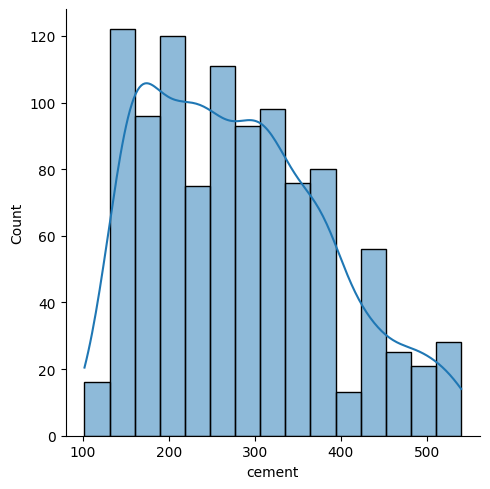

In [11]:
# checking the distribution for the cement columns
plt.figure(figsize=(12, 10))
sns.displot(data.cement, kde=True)

- Here in above distribution plot of cement from the dataset we can say that distribution somewhat showing the gaussian distribution
- Here we can say that we uses 125-130 kg of cement quantity mostly
- The distribution some what skewed toward the right

<Figure size 1200x1000 with 0 Axes>

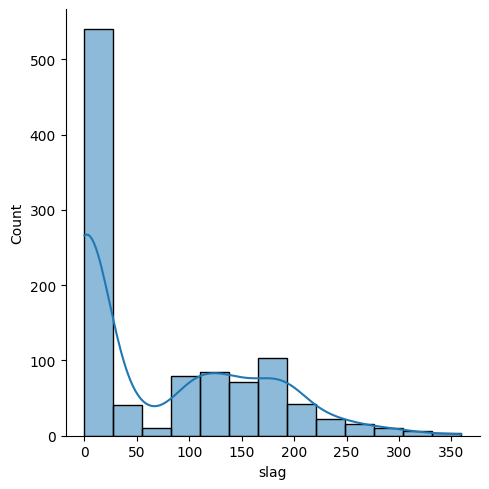

In [12]:
# checking the distribution for the slag columns
plt.figure(figsize=(12, 10))
sns.displot(data.slag, kde=True)

- The above distribution show some what power law distribution
- here we can say that mostly we dont used slag as the contituent for concrete

<Figure size 1200x700 with 0 Axes>

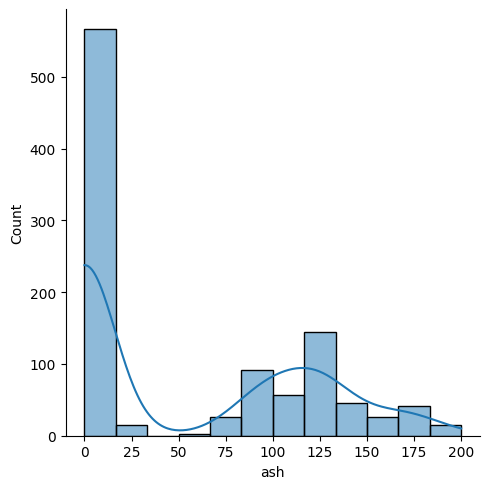

In [13]:
# checking the distribution for the ash columns
plt.figure(figsize=(12, 7))
sns.displot(data.ash, kde=True)

- The above distribution show gaussian distribution if zeroes values not presents
- There are lot of zeores values present in the ash column

<Figure size 1200x700 with 0 Axes>

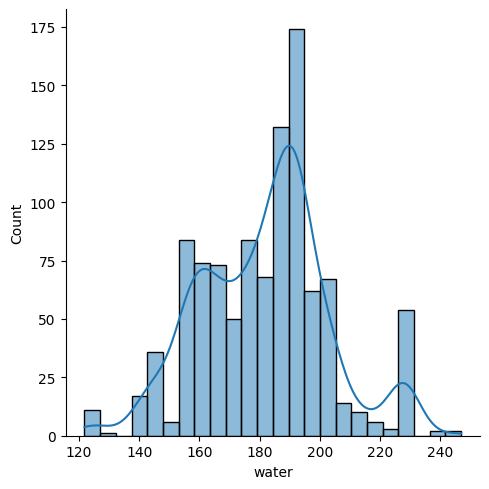

In [14]:
# checking the distribution for the water columns
plt.figure(figsize=(12, 7))
sns.displot(data.water, kde=True)

- the distribution shows gaussian distribution
- mostly we use 150 kg of water

<Figure size 1200x700 with 0 Axes>

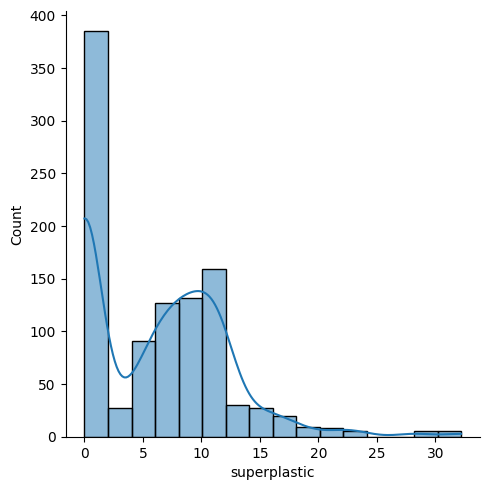

In [15]:
# checking the distribution for the superplastic columns
plt.figure(figsize=(12, 7))
sns.displot(data.superplastic, kde=True)

- the distribution show some what log - normal distribution
- mostly we dont use superplasticiser even if we use mostly we used 12kg of superplasticiser

<Figure size 1200x700 with 0 Axes>

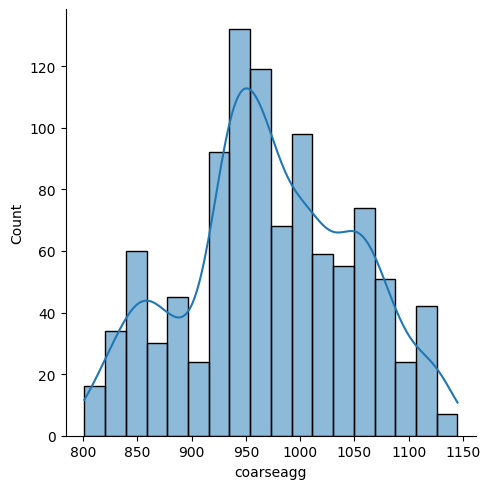

In [16]:
# checking the distribution for the coarseagg columns
plt.figure(figsize=(12, 7))
sns.displot(data.coarseagg, kde=True)

- The above distribution shows gaussian distribution but its some what left skewd
- the average weight of the course agrregate is 950 

<Figure size 1200x700 with 0 Axes>

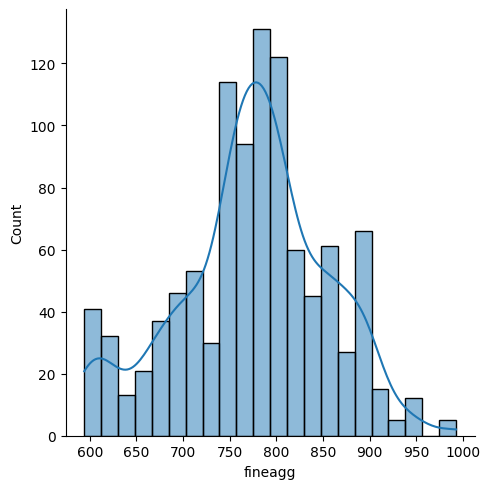

In [17]:
# checking the distribution for the fineagg columns
plt.figure(figsize=(12, 7))
sns.displot(data.fineagg, kde=True)

- The above distribution shows gaussian distribution but its some what left skewd
- mostly the we use 890 kg of weight of the fine aggreagte for the mixture

<Figure size 1200x700 with 0 Axes>

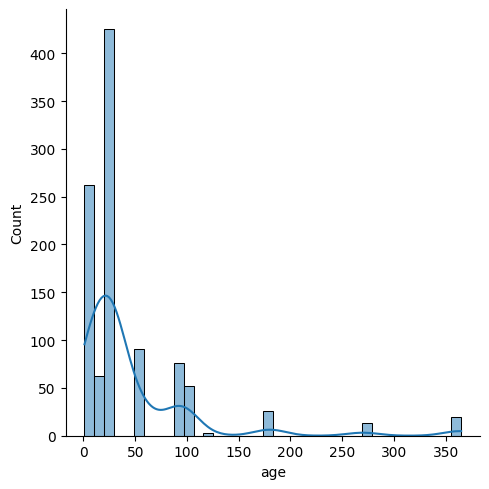

In [18]:
# checking the distribution for the age columns
plt.figure(figsize=(12, 7))
sns.displot(data.age, kde=True)

- mostly we check strenght of the concrete for 28 days 

<Figure size 1200x700 with 0 Axes>

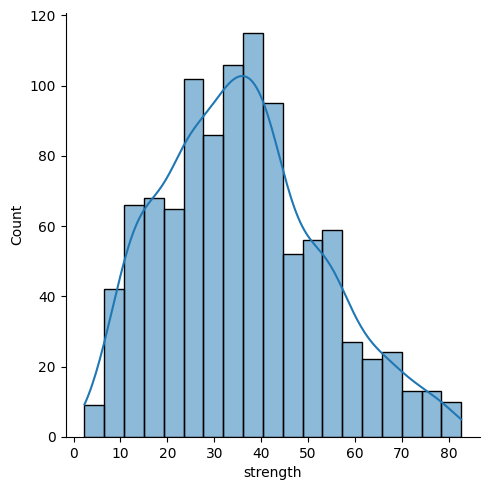

In [19]:
# checking the distribution for the strength columns
plt.figure(figsize=(12, 7))
sns.displot(data.strength, kde=True)

- The strength column is the our target columns means it is our output variable
- The above distribution shows gaussian distribution
- the distribution shows slight positive skewness

In [20]:
#Descriptive statistics of the target variable
data.strength.describe()

count    1030.000000
mean       35.817961
std        16.705742
min         2.330000
25%        23.710000
50%        34.445000
75%        46.135000
max        82.600000
Name: strength, dtype: float64

In [21]:
#Mode value
data.strength.mode()

0    33.4
Name: strength, dtype: float64

## Bivariate Analysis

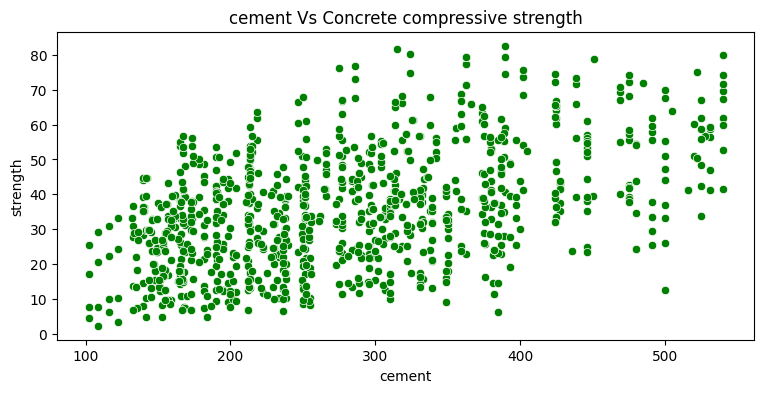

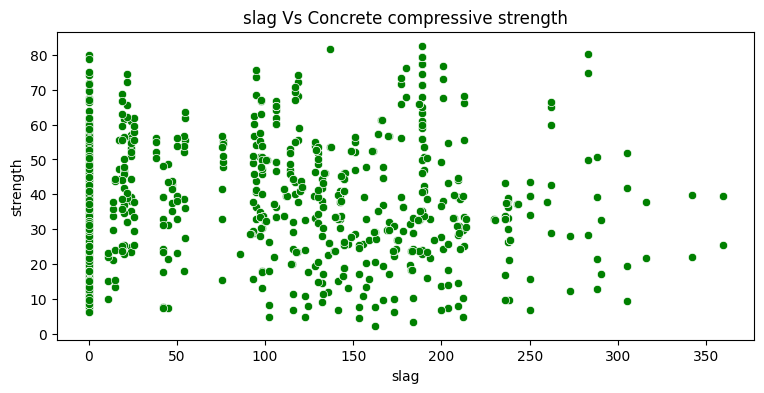

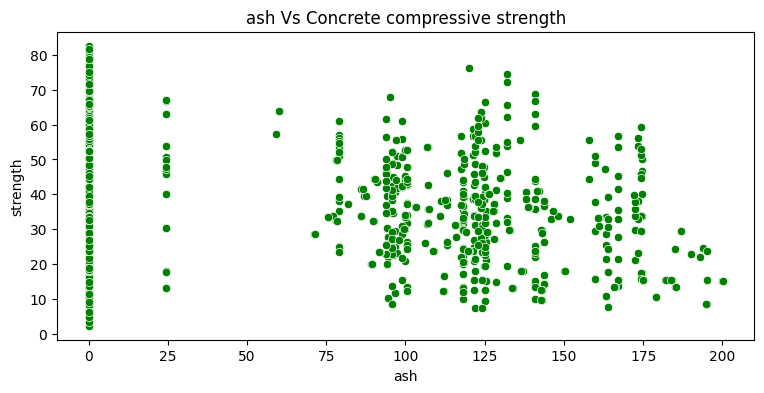

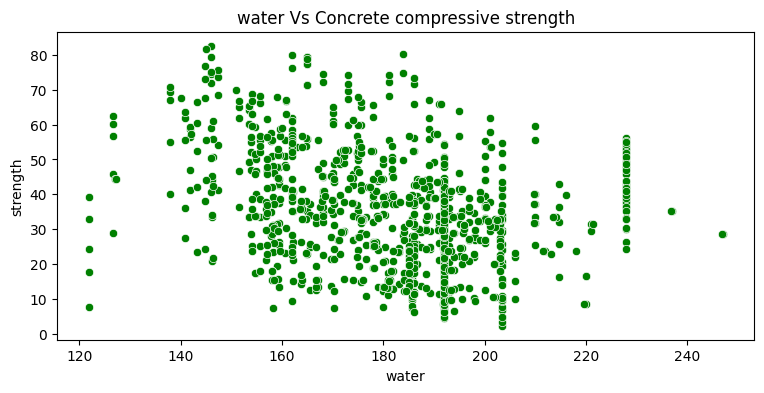

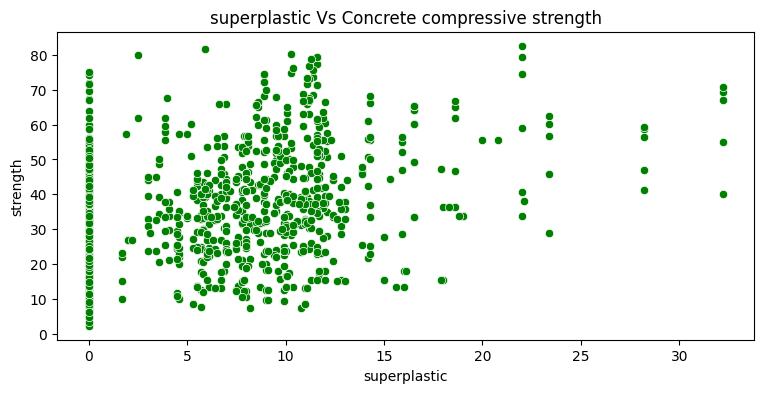

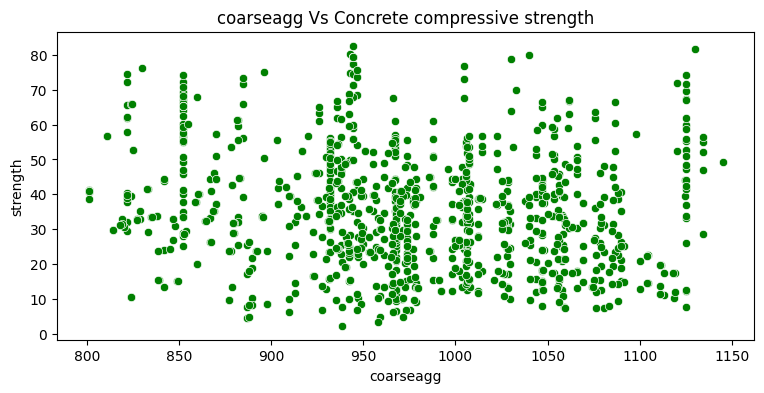

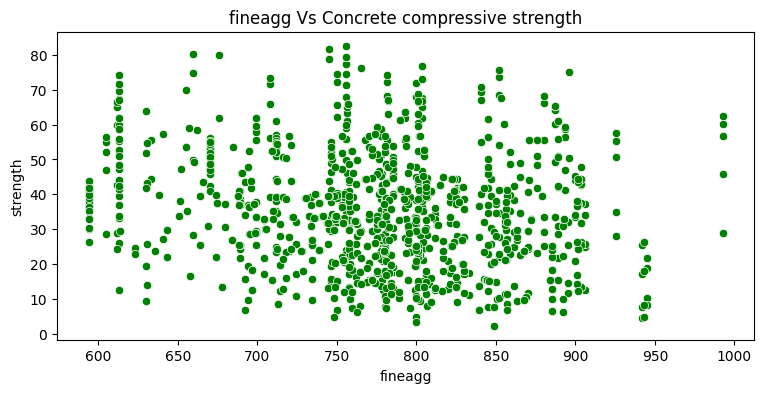

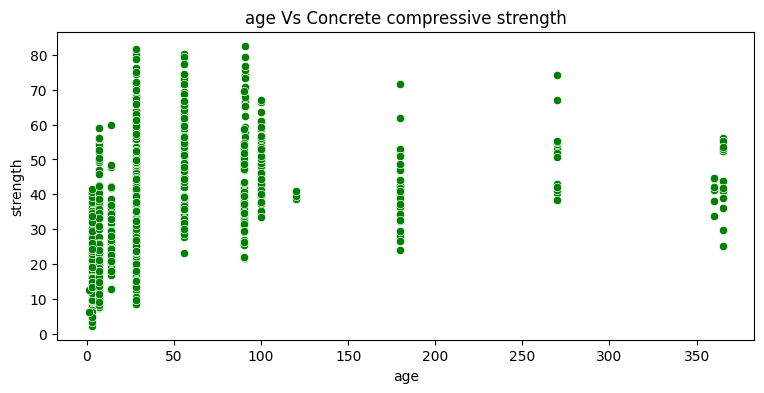

In [22]:
#Independent features Vs dependent feature - Visualization 
for i in data.columns:
    if i != 'strength':
        plt.figure(figsize=(9,4))
        plt.title(i+' '+'Vs Concrete compressive strength')
        sns.scatterplot(x = data[i],y=data.strength, color='green')

- Here in the cement vs compressive strenght and superplasticity vs compressive strength  plot we can see that there is positive correlation among them
- Rest of the distribution shows the linear distribution 

## MUTIVARIATE ANALYSIS

<Axes: xlabel='cement', ylabel='fineagg'>

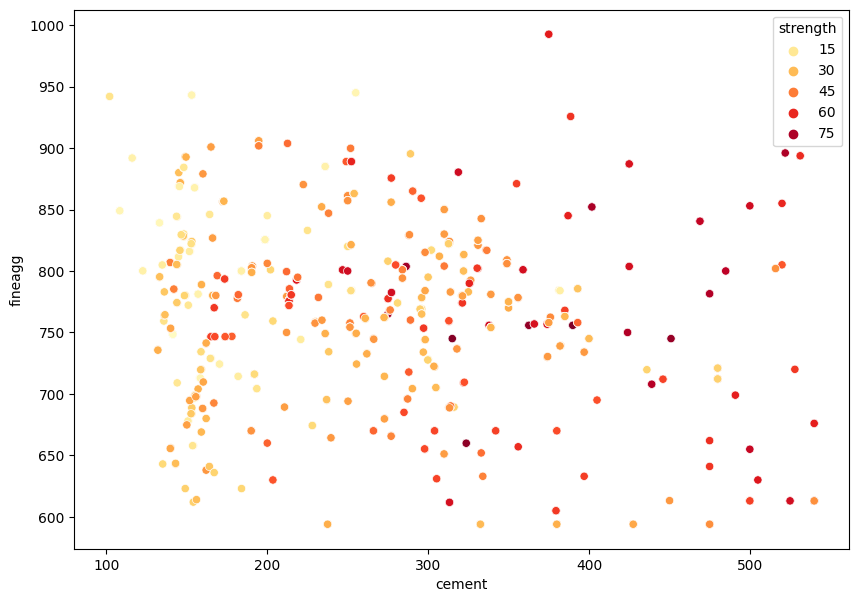

In [23]:
# Analysis between fine aggregate vs cement with respect to the strength
plt.figure(figsize=(10,7))
sns.scatterplot(x = data.cement, y= data.fineagg, hue=data.strength, palette='YlOrRd')

- With this distribution we can say that with adequate proportion of cement and fine aggregate we can get proper strength of the concrete

<Axes: xlabel='cement', ylabel='coarseagg'>

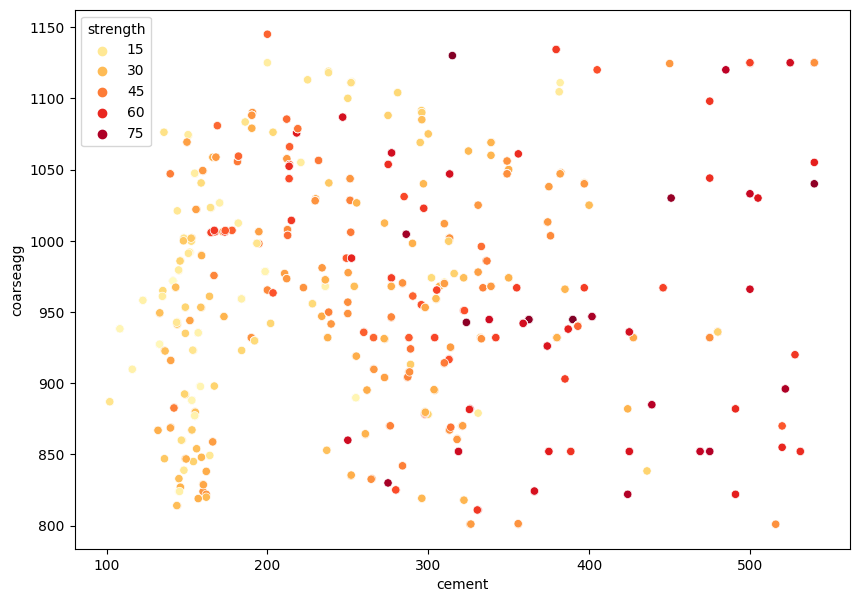

In [24]:
# Analysis between course aggregate vs cement with respect to the strength
plt.figure(figsize=(10,7))
sns.scatterplot(x = data.cement, y= data.coarseagg, hue=data.strength, palette='YlOrRd')

- with this distribution also we can say that we have to pick proper mixture of course aggreate and cement to attain best compressive strenth of the concrete

<Figure size 1500x700 with 0 Axes>

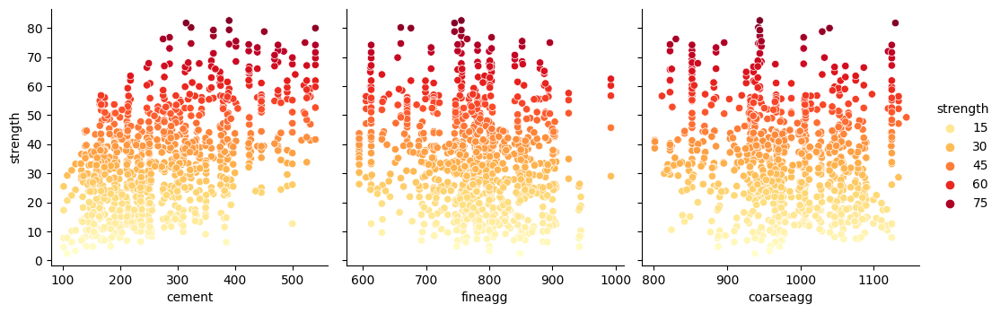

In [25]:
plt.figure(figsize=(15,7))
sns.pairplot(data, x_vars=['cement', 'fineagg', 'coarseagg'], y_vars=['strength'], kind='scatter', hue='strength', palette='YlOrRd', aspect=1, height=3.5)

- Here we can say that by increasing the main constituent of concrete i.e cement, fine aggregate and couse aggregate we achieve better strength


<Axes: xlabel='cement', ylabel='water'>

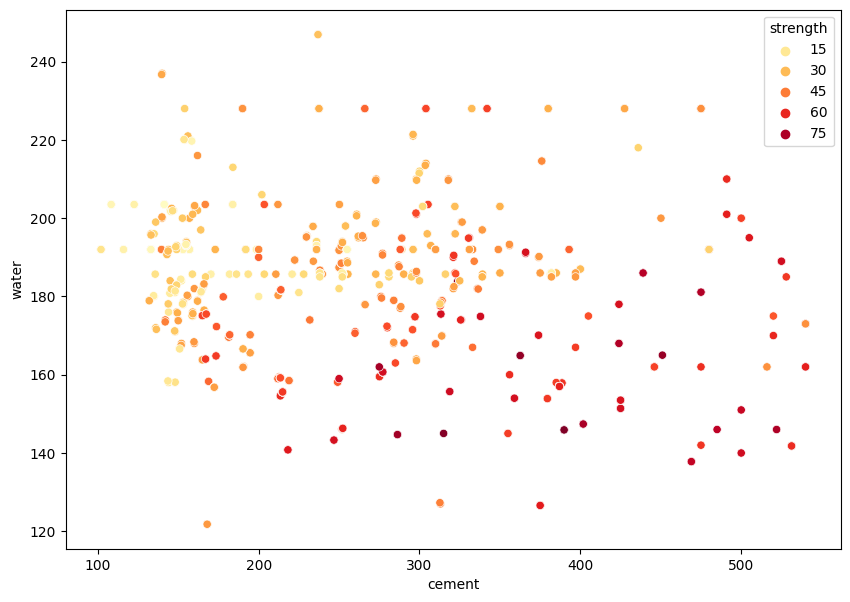

In [26]:
# Analysis between fine water vs cement with respect to the strength
plt.figure(figsize=(10,7))
sns.scatterplot(x = data.cement, y= data.water, hue=data.strength, palette='YlOrRd')

- with increase in the water quantity at a certain level with respect to the cement we can achieve the better  compressive strenght of the concrete

In [27]:
# For the visualisation we can also use pandas profilling method for checking the more insight of the dataset
# if we dont have the pandas profiling library we can do by:
# pip install ydata-profiling

In [28]:
from ydata_profiling import ProfileReport
profile = ProfileReport(data)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

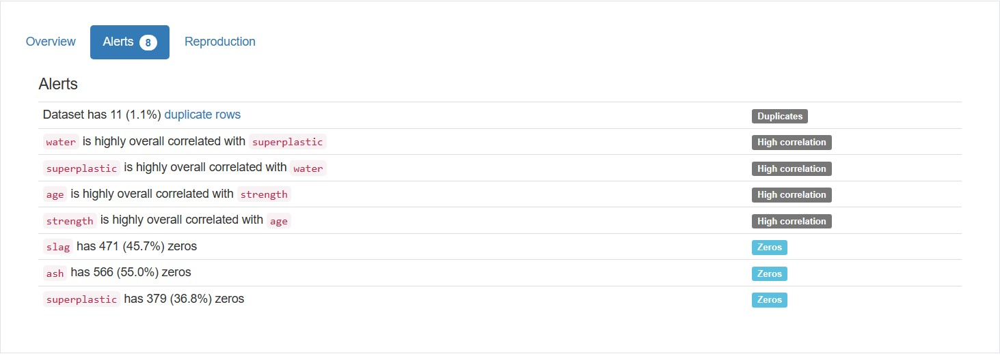

- Lots of zeroes are present in the slag, ash, superplastic columns

## check for the outliers 

In [29]:
def outliers(columns):
    plots, axis = plt.subplots(1, 2, figsize=(8,4))
    axis[0].boxplot(data[columns])
    sns.distplot(data[columns], ax=axis[1])
    plt.tight_layout()
    plt.show()

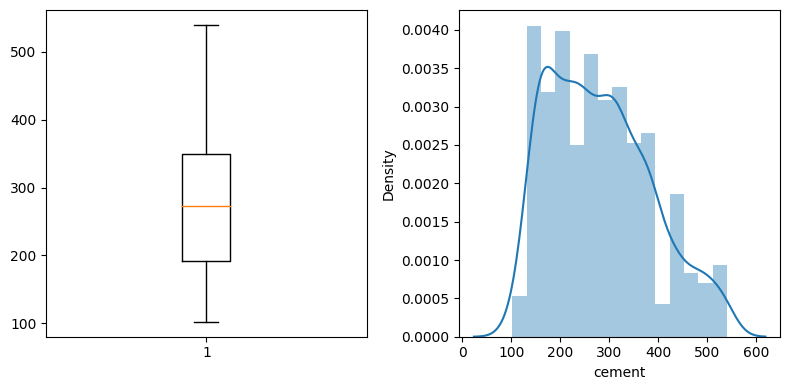

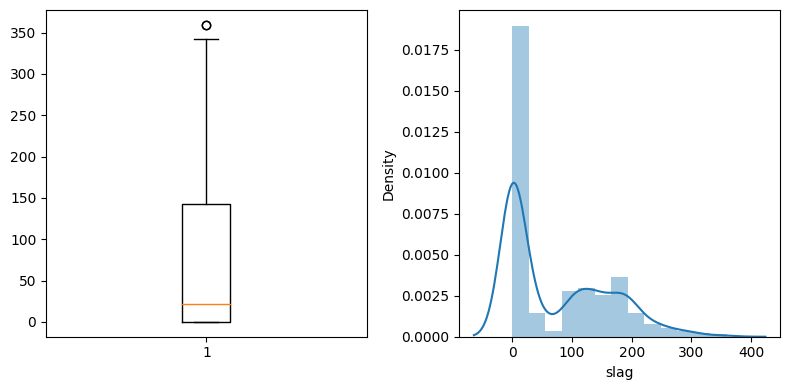

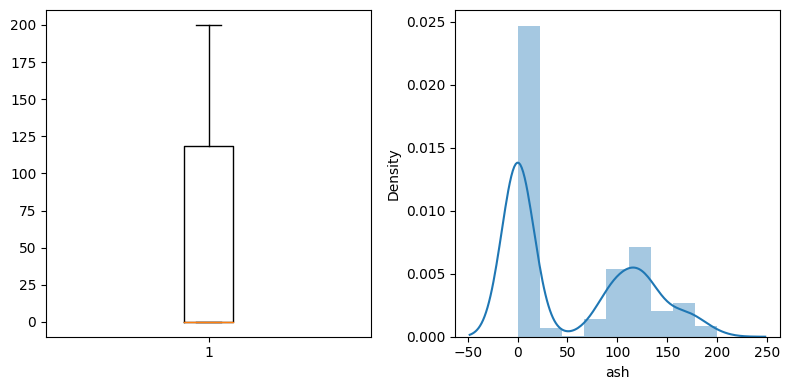

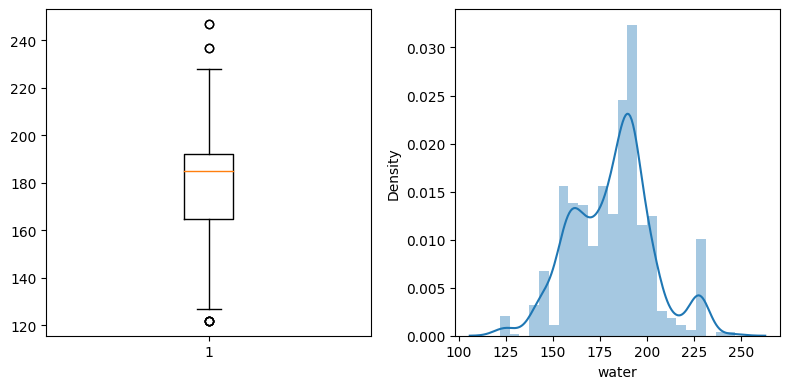

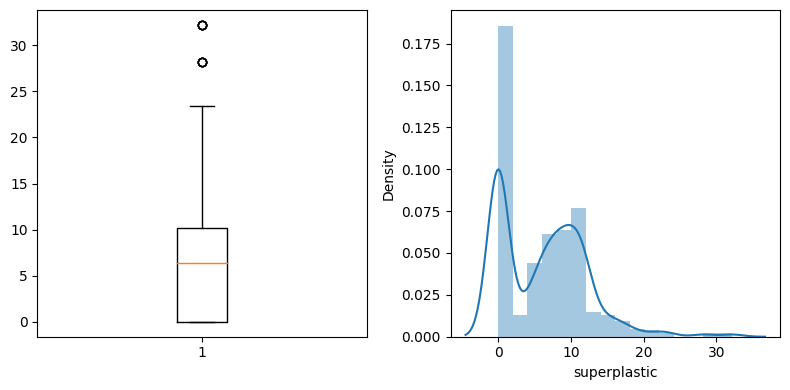

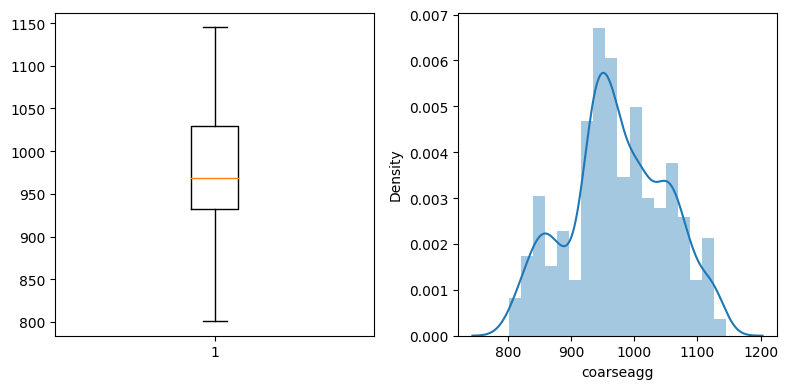

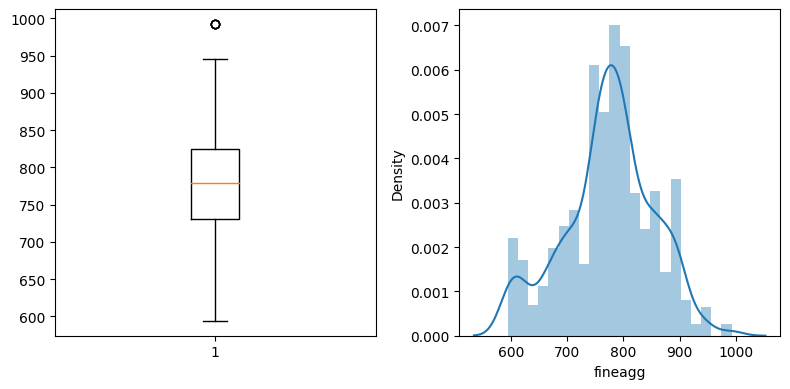

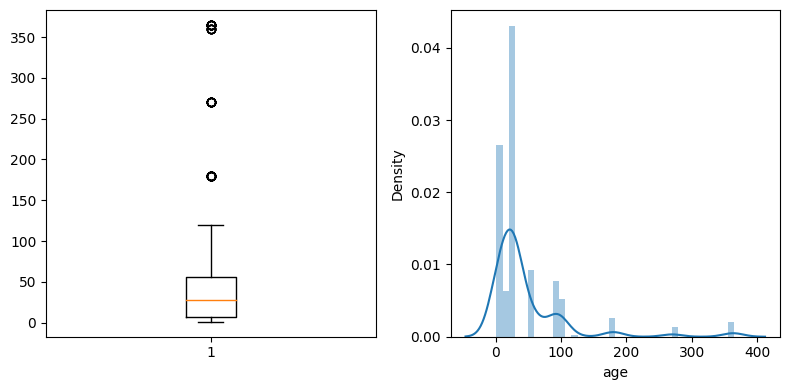

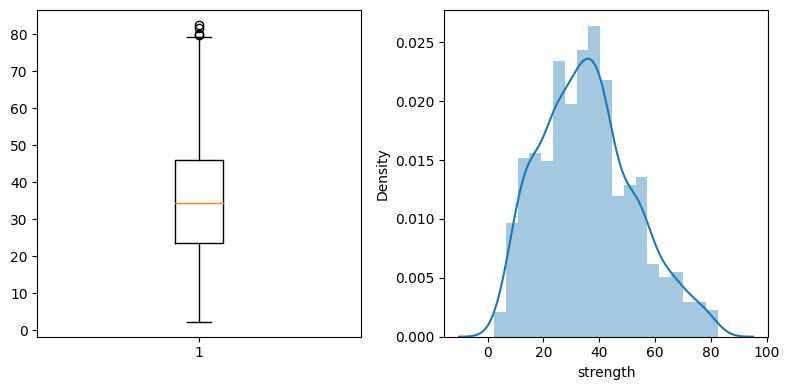

In [30]:
for columns in data.columns:
    outliers(columns)

- so we can say that that there lots of outliers are present in the age and superplastic columns

# DATA PREPROCESSING

- In this process we will do following steps:
    - Imputing missing values with mean or median values if missing values present
    
    - Removing The duplicated data present in the dataset
    
    - Transforming the dataset according to our needs
    
    - converting the categorical columns to numerical columns. this can be done by:
        - manually encoding the data 
        - One Hot Encoding
        - Label encoding
    
    - Removing the outliers present in the dataset if present
    
    - Feature scaling
    
    - For feature selection we can use Heatmap correlation
    
    - If there is imbalanced dataset is present we need to balance this dataset

- In our dataset there is no mising values present in the dataset so we dont need to handle missing values
- There are lots of duplicated data present in the dataset so we need to remove the duplicated data
- Lots of zeroes are present in the ash, slag and superplastic columns
- so we highly skewed feature columns present in dataset like age, supeplastic, ash, slag so we need to transform this columns in log- transform

### Dropping the duplicated data points

In [31]:
data.drop_duplicates(inplace=True)

In [32]:
data.duplicated().sum() #checking the duplicated data, so now we have dropped down all the duplicated rows

0

In [33]:
data.shape # The shape of the dataset after droping the duplicated data

(1005, 9)

## Removing the the outliers

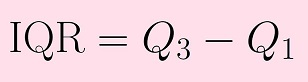 <t><t><t><t><t><t> 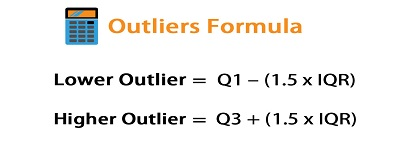

In [34]:
# This function uses IQR method to remove all the outliers present in the dataset
# This function takes columns names as input 
def remove_outliers(columns):
    Q1 = np.percentile(data[columns], 25, method='midpoint') # Here first quartile range is calculated 
    Q3 = np.percentile(data[columns], 75, method='midpoint') # Here third quartile range is calculated 
    IQR = Q3 - Q1  # calculating the the inter quartile range of the feture column
    
    lower_limit = Q3 - 1.5*IQR  # calculating the lower bound of  the feature column
    upper_limit = Q3 + 1.5*IQR  # calculating the upper bound of the feature column
    print(f'lower limit:-- {lower_limit}, upper_limit:-- {upper_limit}')
    
    print('--------------\n\n')
    print(f'These are the Outlier present in {columns} column below lower limits {data.loc[data[columns] < lower_limit]}', '\n\n')
    print(f'These are the Outlier present in {columns} above upper limits {data.loc[data[columns] > upper_limit]}', '\n\n')
    print('-------------------------', '\n')
    print('Total outliers present below lower limit:---', len(data.loc[data[columns] < lower_limit]) )
    print('Total outliers present above upper limit:---', len(data.loc[data[columns] > upper_limit]), '\n\n' )
    
    
    data.loc[data[columns] < lower_limit, columns] = np.median(data[columns])
    data.loc[data[columns] > upper_limit, columns] = np.median(data[columns])
    
    print(f'check for outliers present in {columns} column below lower limits after imputing median values{data.loc[data[columns] < lower_limit]}')
    print(f'check for Outlier present in {columns} above upper limits after imputing median values{data.loc[data[columns] > upper_limit]}')
    print('-------------\n\n')
    
    print('Total outliers present below lower limit after imputing median values:---', len(data.loc[data[columns] < lower_limit]) )
    print('Total outliers present above upper limit after imputing the median values:---', len(data.loc[data[columns] > upper_limit]), '\n\n\n' )

In [35]:
# This for loop automatically fetch all the feature column and passes the column name to the remove outlier function
for columns in data.columns[:8]:
    print(columns)
    print('-----------\n\n')
    remove_outliers(columns)

cement
-----------


lower limit:-- 111.54999999999998, upper_limit:-- 586.45
--------------


These are the Outlier present in cement column below lower limits      cement   slag  ash  water  superplastic  coarseagg  fineagg  age  \
652   102.0  153.0  0.0  192.0           0.0      887.0    942.0    3   
653   102.0  153.0  0.0  192.0           0.0      887.0    942.0   90   
657   108.3  162.4  0.0  203.5           0.0      938.2    849.0   28   
659   108.3  162.4  0.0  203.5           0.0      938.2    849.0   90   
677   102.0  153.0  0.0  192.0           0.0      887.0    942.0    7   
680   102.0  153.0  0.0  192.0           0.0      887.0    942.0   28   
688   108.3  162.4  0.0  203.5           0.0      938.2    849.0    3   
697   108.3  162.4  0.0  203.5           0.0      938.2    849.0    7   

     strength  
652      4.57  
653     25.46  
657     20.59  
659     29.23  
677      7.68  
680     17.28  
688      2.33  
697      7.72   


These are the Outlier present in c

- From above function we removes all the outliers present in the dataset
- Now we again check for the outlier with the help of boxplot method. This will easily visualise our dataset is there outliers present in dataset or not

### check for the outliers

In [36]:
# This function takes columns names and plot the outliers, distribution and qq plot for better visulaisation of the outliers present in the dataset
def outliers_with_qq(columns):
    # importing the statmodel library for ploting the QQ-plot
    import statsmodels.api as sm
    
    plots, axis = plt.subplots(1, 3, figsize=(8,4)) # canvas size
    axis[0].boxplot(data[columns]) # plotting the box plot for visualising the ouliers
    sm.qqplot(data[columns], line ='45', ax=axis[1]) # plotting the QQ-PLot for visualisation of Whether two samples have the same distribution shape.
    sns.distplot(data[columns], ax=axis[2]) # plotting the distplot for visualising the distplot
    plt.title(columns)
    plt.tight_layout()
    plt.show()

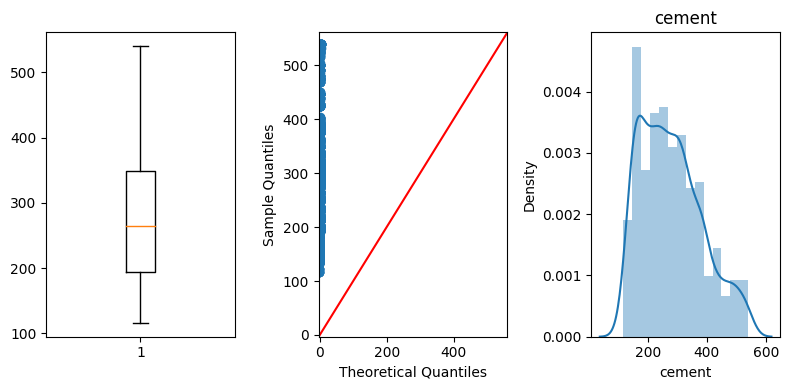

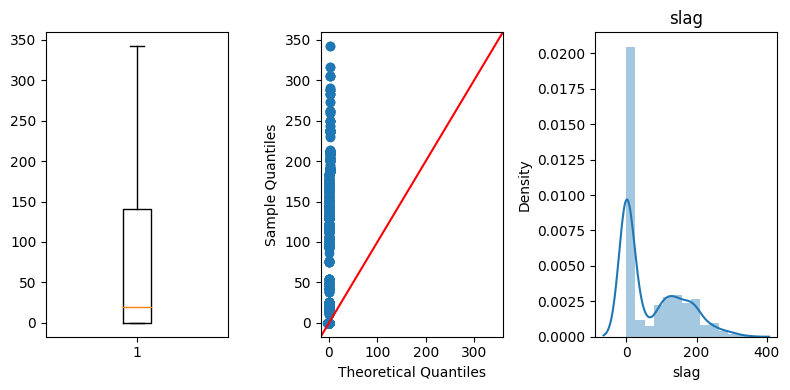

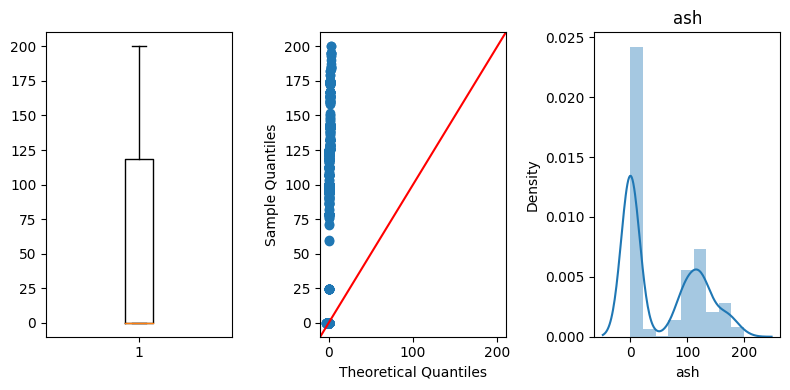

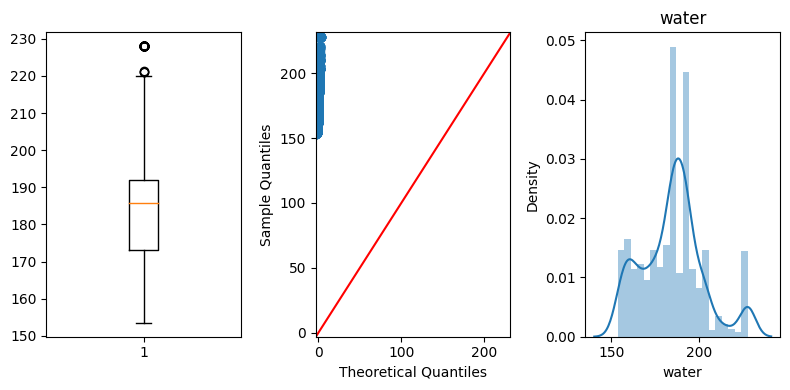

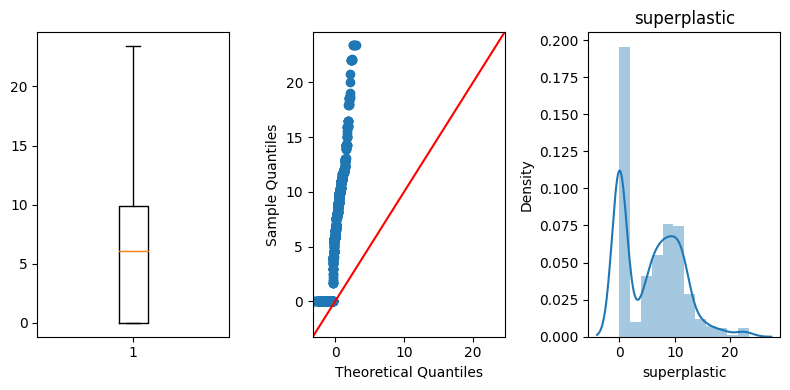

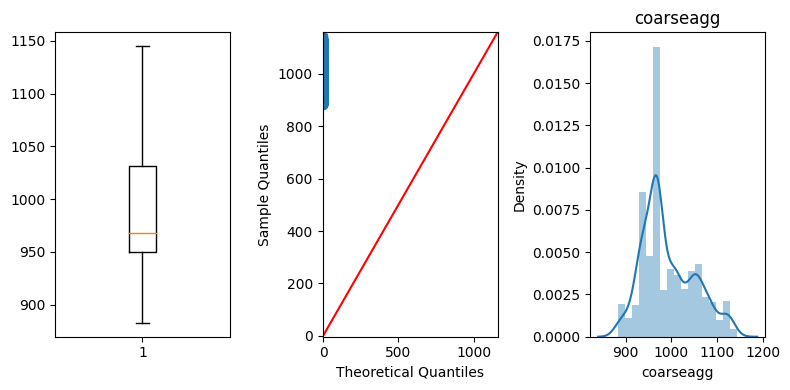

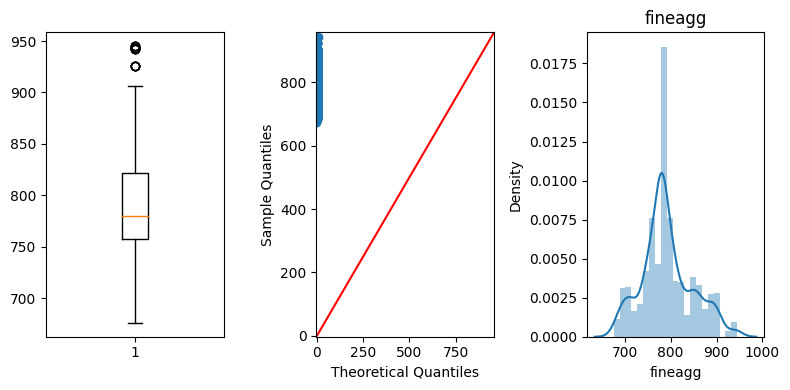

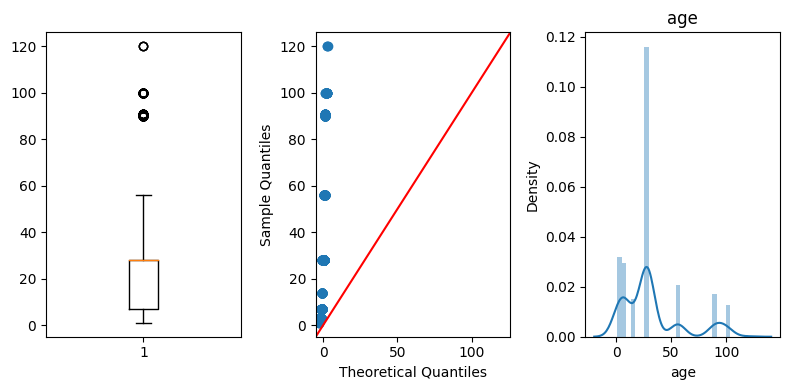

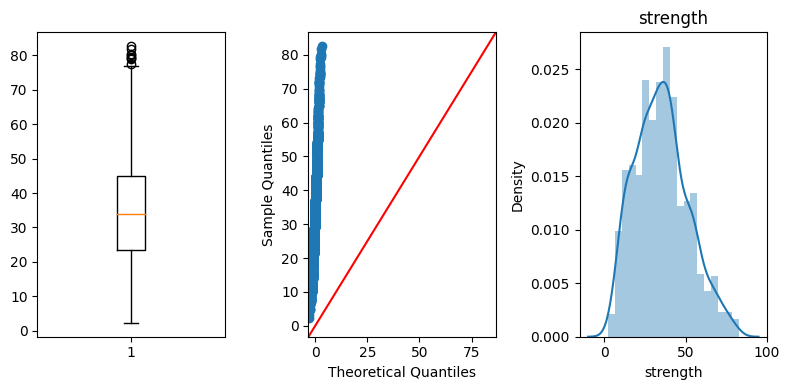

In [37]:
# plotting the graph
for columns in data.columns:
    outliers_with_qq(columns)

### Data Transformation

In [38]:
# Count number of zeros in all columns of Dataframe
for column_name in data.columns:
    column = data[column_name]
    # Get the count of Zeros in column 
    count = (column == 0).sum()
    print('Count of zeros in column ', column_name, ' is : ', count)

Count of zeros in column  cement  is :  0
Count of zeros in column  slag  is :  470
Count of zeros in column  ash  is :  541
Count of zeros in column  water  is :  0
Count of zeros in column  superplastic  is :  378
Count of zeros in column  coarseagg  is :  0
Count of zeros in column  fineagg  is :  0
Count of zeros in column  age  is :  0
Count of zeros in column  strength  is :  0


In [39]:
data.replace(0, np.nan, inplace=True) # replacing the all the zeores values in NaN values 

In [40]:
data.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,540.0,NaN,NaN,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,NaN,NaN,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,NaN,228.0,NaN,932.0,780.0,28,40.27
3,332.5,142.5,NaN,228.0,NaN,932.0,780.0,28,41.05
4,198.6,132.4,NaN,192.0,NaN,978.4,825.5,28,44.30


In [41]:
# We used KNN Imputer method for imputing the zeroes values, beacause imputing the mean or median values leads to produces biasness toward median/ mean values.
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)
data_imputed = imputer.fit_transform(data)

In [42]:
non_zero_data = pd.DataFrame(data_imputed, columns= data.columns) # creating the dataframe from the array produced after imputing the zeores values 
non_zero_data.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,540.0,26.0,123.00,162.0,2.5,1040.0,676.0,28.0,79.99
1,540.0,26.0,123.00,162.0,2.5,1055.0,676.0,28.0,61.89
2,332.5,142.5,137.95,228.0,10.9,932.0,780.0,28.0,40.27
3,332.5,142.5,137.95,228.0,10.9,932.0,780.0,28.0,41.05
4,198.6,132.4,113.00,192.0,8.0,978.4,825.5,28.0,44.30


# Splitting the Dataset into Independent and dependent features

In [43]:
# Independent Feature
X = non_zero_data.iloc[:,:-1] 
X

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age
0,540.0,26.0,123.00,162.0,2.5,1040.0,676.0,28.0
1,540.0,26.0,123.00,162.0,2.5,1055.0,676.0,28.0
2,332.5,142.5,137.95,228.0,10.9,932.0,780.0,28.0
3,332.5,142.5,137.95,228.0,10.9,932.0,780.0,28.0
4,198.6,132.4,113.00,192.0,8.0,978.4,825.5,28.0
...,...,...,...,...,...,...,...,...
1000,276.4,116.0,90.30,179.6,8.9,968.0,768.3,28.0
1001,322.2,145.0,115.60,196.0,10.4,968.0,813.4,28.0
1002,148.5,139.4,108.60,192.7,6.1,892.4,780.0,28.0
1003,159.1,186.7,183.95,175.6,11.3,989.6,788.9,28.0


In [44]:
# Dependent featurre
y = non_zero_data.iloc[:,-1]
y

0       79.99
1       61.89
2       40.27
3       41.05
4       44.30
        ...  
1000    44.28
1001    31.18
1002    23.70
1003    32.77
1004    32.40
Name: strength, Length: 1005, dtype: float64

### We have to transform our dataset  into power transformation so that we can achieve a better distribution of the dataset
- Power transformation is a convenient means of transforming a highly skewed variable into a more normalized dataset.


In [45]:
from sklearn.preprocessing import PowerTransformer
power_trans = PowerTransformer(method='yeo-johnson')
power_trans.fit(X)
transformed_dataset_X = pd.DataFrame(power_trans.transform(X), columns=X.columns)
transformed_dataset_X.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age
0,1.981029,-1.693715,0.077799,-1.376672,-2.275106,0.913552,-2.465768,0.173174
1,1.981029,-1.693715,0.077799,-1.376672,-2.275106,1.120916,-2.465768,0.173174
2,0.640528,0.182547,0.537099,2.176770,0.526312,-1.126662,-0.141786,0.173174
3,0.640528,0.182547,0.537099,2.176770,0.526312,-1.126662,-0.141786,0.173174
4,-0.745215,0.040770,-0.224110,0.458611,-0.188107,-0.114390,0.670731,0.173174


In [46]:
# checking the distribution again after the imputation and log transformation and checking the whether the distribution improved or not
def outliers_with_qq(columns):
    import statsmodels.api as sm
    
    plots, axis = plt.subplots(1, 3, figsize=(8,4))
    axis[0].boxplot(transformed_dataset_X[columns])
    sm.qqplot(transformed_dataset_X[columns], line ='45', ax=axis[1])
    sns.distplot(transformed_dataset_X[columns], ax=axis[2])
    plt.tight_layout()
    plt.show()

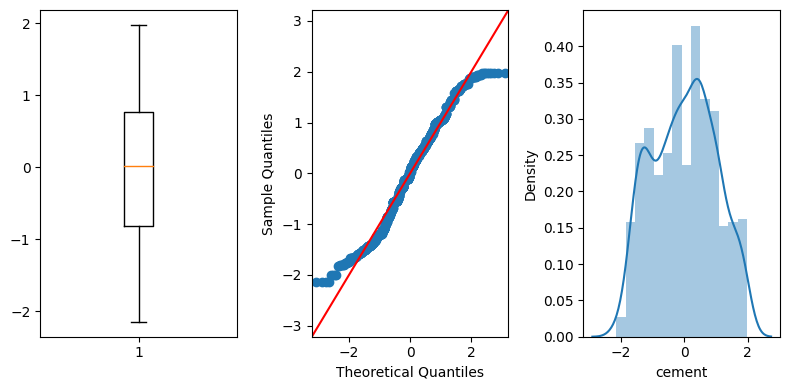

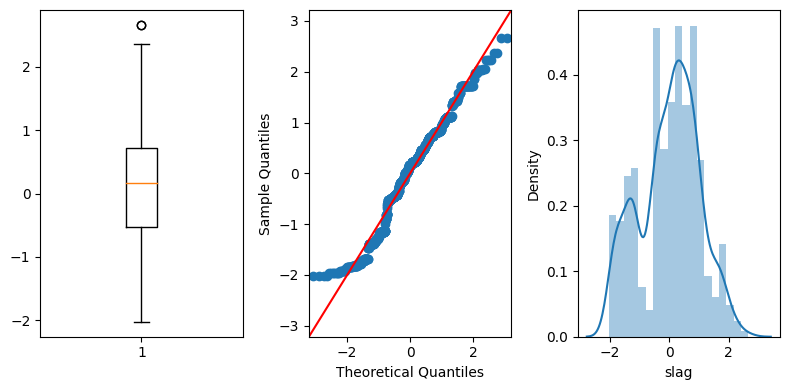

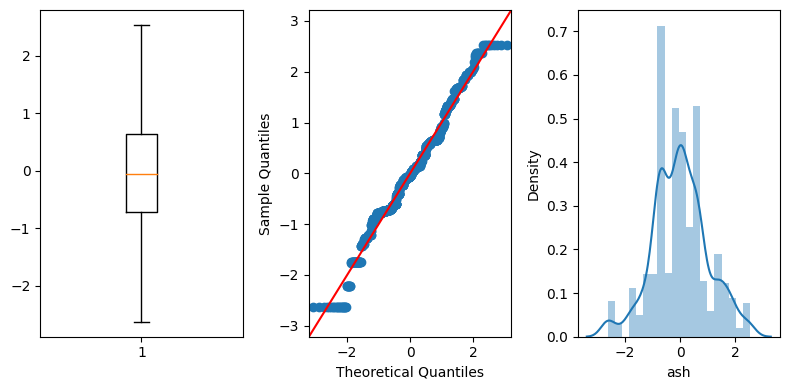

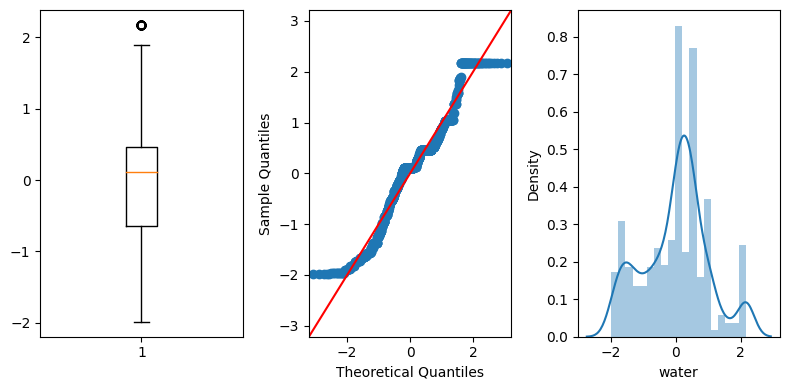

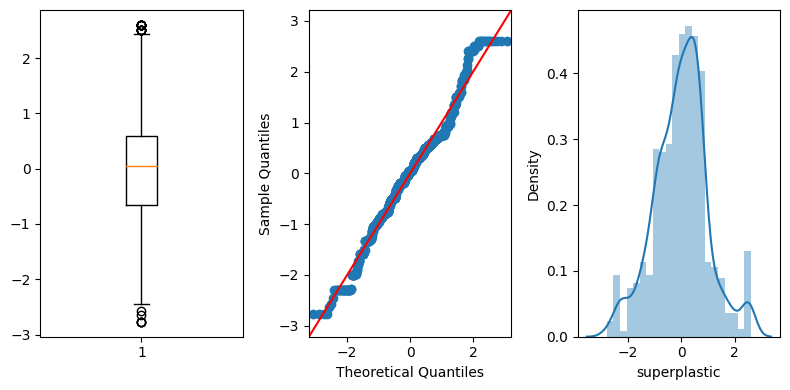

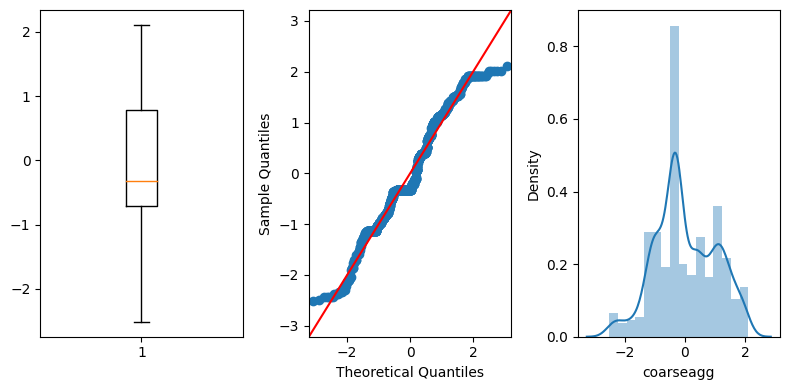

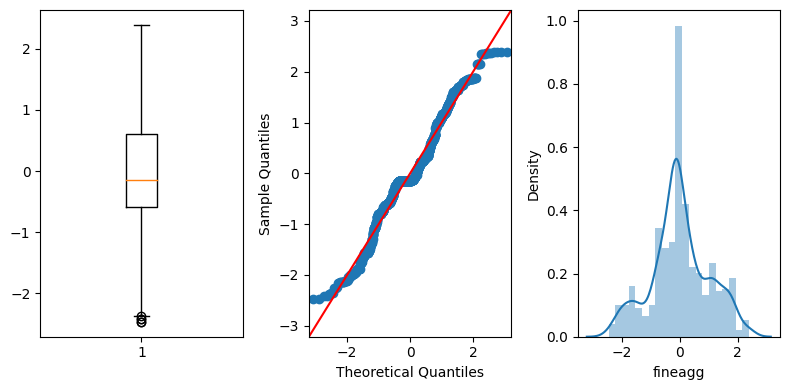

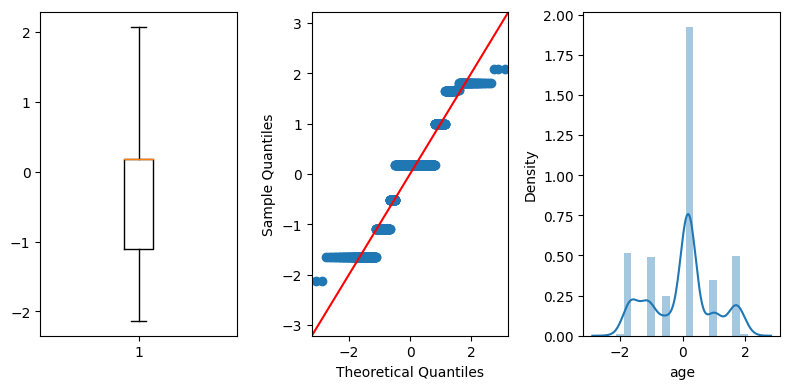

In [47]:
for columns in transformed_dataset_X.columns:
    outliers_with_qq(columns)

- Here we can see that after log transformation we have achieved much better distribution of the feature columns

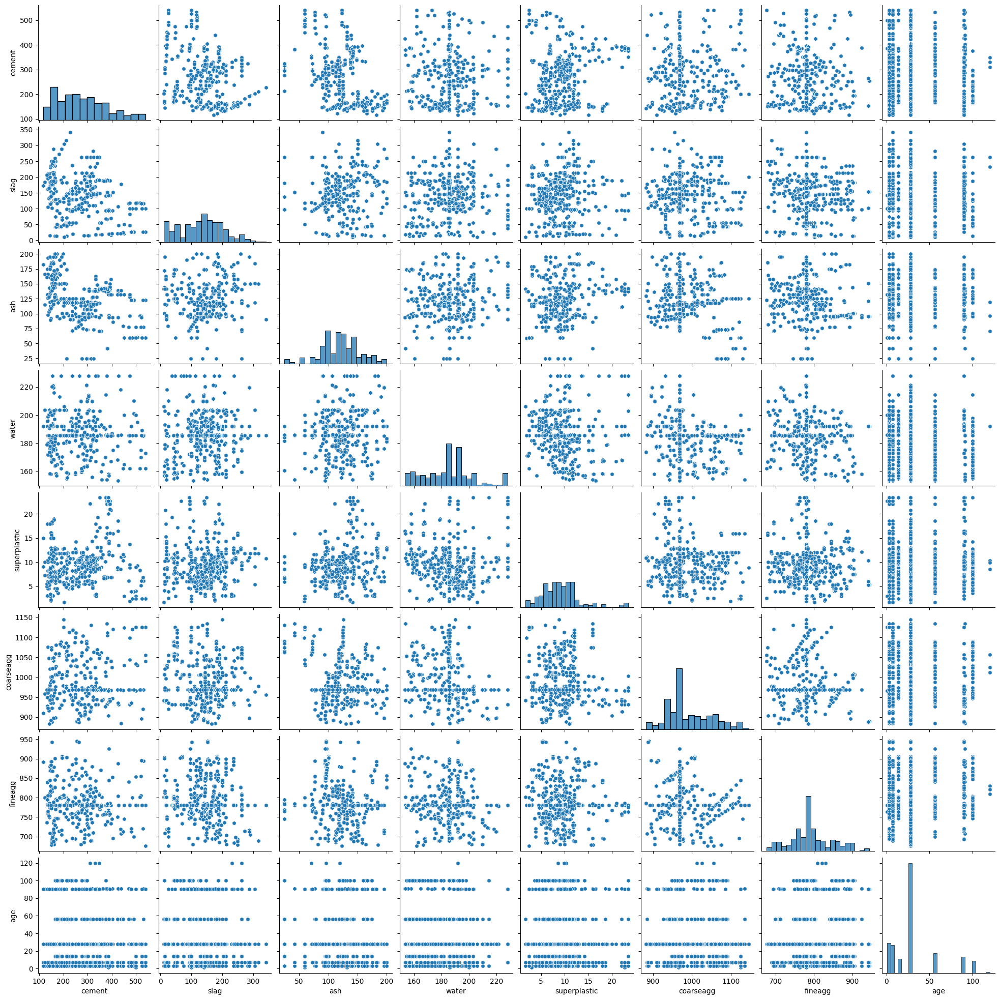

In [48]:
# Visualising the Pair Plot
sns.pairplot(X, markers= "h")

# SCALING THE DATASET

In [49]:
# importing the neccessary libraires
# Since after Power transformation our range of values b/w different feature columns is decreased. 
#  So we dont need to scale our data but if we have to scale our dataset we can use this code to scale our dataset 

from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
dataset = scale.fit_transform(transformed_dataset_X)

In [50]:
dataset

array([[ 1.9810294 , -1.69371473,  0.07779949, ...,  0.913754  ,
        -2.46576846,  0.17317431],
       [ 1.9810294 , -1.69371473,  0.07779949, ...,  1.12111825,
        -2.46576846,  0.17317431],
       [ 0.6405278 ,  0.1825467 ,  0.53709869, ..., -1.12645951,
        -0.14178618,  0.17317431],
       ...,
       [-1.50919849,  0.13928154, -0.35550902, ..., -2.20924564,
        -0.14178618,  0.17317431],
       [-1.32916585,  0.77854352,  2.00234654, ...,  0.09631054,
         0.02541809,  0.17317431],
       [-0.01653555, -0.42457449, -1.2334597 , ..., -0.32050727,
        -0.50339009,  0.17317431]])

In [51]:
indpendent_fea = pd.DataFrame(dataset, columns= X.columns) # after scaling the array produced we need to save it into dataframe
indpendent_fea

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age
0,1.981029,-1.693715,0.077799,-1.376672,-2.275106,0.913754,-2.465768,0.173174
1,1.981029,-1.693715,0.077799,-1.376672,-2.275106,1.121118,-2.465768,0.173174
2,0.640528,0.182547,0.537099,2.176770,0.526312,-1.126460,-0.141786,0.173174
3,0.640528,0.182547,0.537099,2.176770,0.526312,-1.126460,-0.141786,0.173174
4,-0.745215,0.040770,-0.224110,0.458611,-0.188107,-0.114188,0.670731,0.173174
...,...,...,...,...,...,...,...,...
1000,0.139033,-0.194836,-0.891742,-0.245809,0.050260,-0.320507,-0.368208,0.173174
1001,0.554767,0.217282,-0.146044,0.671898,0.413351,-0.320507,0.464585,0.173174
1002,-1.509198,0.139282,-0.355509,0.496400,-0.757814,-2.209246,-0.141786,0.173174
1003,-1.329166,0.778544,2.002347,-0.488295,0.614119,0.096311,0.025418,0.173174


# FEATURE SELECTION

<Axes: >

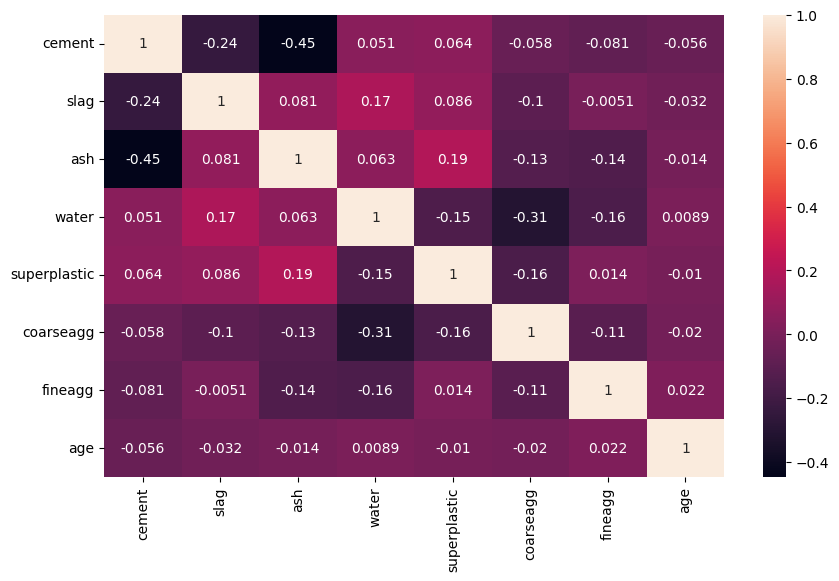

In [52]:
# checking if any feature columns have any correlation higher that 80% with each other. if it present we need to drop the any one feature column
plt.figure(figsize=(10,6))
sns.heatmap(indpendent_fea.corr(), annot=True) 

#### No feature column is correlated to each other so we didn't need to drop any columns

# MODEL CREATION

### Approch:- 
- Here we will split our dataset into Dependent and Independent feature columns
- Then we will split dependent and independent feature columns into train test dataset where test size will be 25% of the dataset.
- Then we will perform different types of regression models to train our dataset
- After that we will check its accuracy score and the error size.
- After that we will check which model is giving highest accuracy score and less error.
- We will perform a Hyper Parameter check on the model which have high accuracy score.
- The model which give highest accuracy score will be selected as for predicting our output.

### Train Test Split

In [53]:
# Importing the scikit learn library for train test split the dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(transformed_dataset_X, y, test_size=0.25, random_state=75)

In [54]:
# The shape of train and test dataset
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((753, 8), (252, 8), (753,), (252,))

# 1.  Linear Regression

In [55]:
# Importing the library for the Linear Regression
from sklearn.linear_model import LinearRegression

In [56]:
# saving the Linear model in the object variable
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train) # Training the model using the training sets

LinearRegression()

In [57]:
# Here we performing predictions using the testing set 
linear_predict = linear_reg.predict(X_test)

### Model Evalution

In [58]:
# Checking the accuracy score and the errors in the model
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
linear_r2_score = r2_score(y_test, linear_predict) # This will give the accuracy of the model
linear_r2_score # printing the accuracy

0.5985762894408738

In [59]:
linear_MSE = mean_squared_error(y_test, linear_predict) # Checking the mean squared error
linear_MSE

93.40988059221017

In [60]:
linear_RMSE = np.sqrt(mean_squared_error(y_test, linear_predict)) # checking the  root mean squared of error of the model
linear_RMSE

9.664878715856199

In [61]:
linear_MAE = mean_absolute_error(y_test, linear_predict) # checking the mean absolute error of the linear model
linear_MAE

7.576411485040617

In [62]:
linear_reg_train_score = linear_reg.score(X_train, y_train) # Training score of the linear regression model
linear_reg_train_score

0.658426311366374

In [63]:
# Summmarizing the linear model evaluation scores
from tabulate import tabulate
my_data = [['R2_Score', "0.59"],
           ["Training Score", 0.66],
           ["Root Mean Square Error", "9.96"],
           ["Mean Square Error", "99.32"],
           ["Mean Absolute Error", "8.18"],
          ]
head = ["Linear Model Evaluation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+---------------------------+---------+
| Linear Model Evaluation   |   Score |
+===========================+=========+
| R2_Score                  |    0.59 |
+---------------------------+---------+
| Training Score            |    0.66 |
+---------------------------+---------+
| Root Mean Square Error    |    9.96 |
+---------------------------+---------+
| Mean Square Error         |   99.32 |
+---------------------------+---------+
| Mean Absolute Error       |    8.18 |
+---------------------------+---------+


Text(0.5, 1.0, 'Linear Regression')

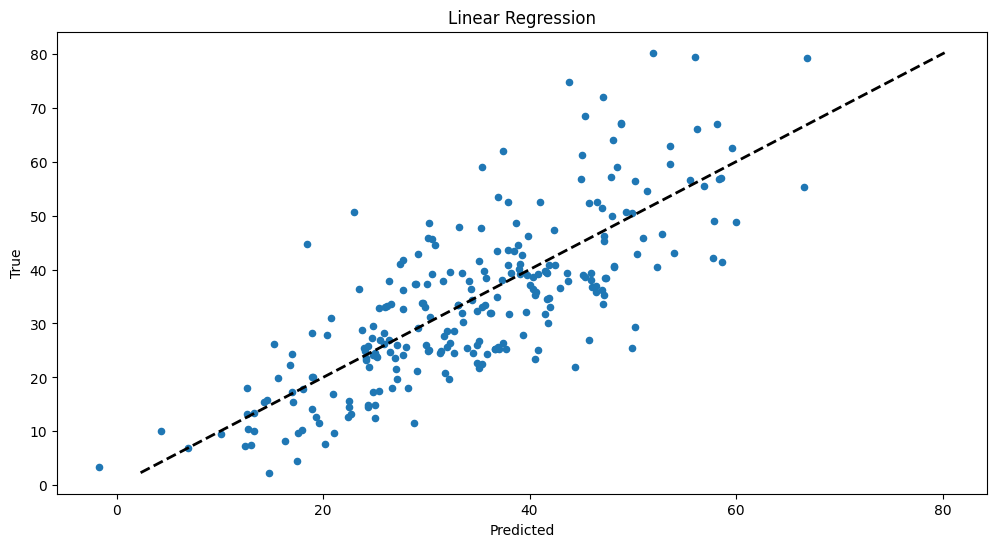

In [64]:
# Plotting the Linear model actual values vs Predicted values graph
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(linear_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Linear Regression")

#### This model shows under fitting condition

# 2. Lasso Regression

In [65]:
# Importing the necessary library for the Lasso Regression
from sklearn.linear_model import Lasso
lasso_reg = Lasso() # saving the model into object variable

In [66]:
lasso_reg.fit(X_train, y_train) # Training the model using the training datasets

Lasso()

In [67]:
# Here we performing predictions using the testing set 
lasso_predict = lasso_reg.predict(X_test)

###  Model Evalution

In [68]:
# Checking the accuracy score ana the errors in the model
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
lasso_R2_score = r2_score(y_test, lasso_predict) # checking the accuracy of the model
lasso_R2_score

0.5593063861298024

In [69]:
lasso_MSE = mean_squared_error(y_test, lasso_predict) # Mean squared error of the model
lasso_MSE

102.54784848664656

In [70]:
lasso_RMSE = np.sqrt(mean_squared_error(y_test, lasso_predict)) # root mean squared error 
lasso_RMSE

10.126591158264787

In [71]:
lasso_MAE = mean_absolute_error(y_test, lasso_predict) # mean absolute error 
lasso_MAE

8.037142139120839

In [72]:
lasso_reg_train_score = lasso_reg.score(X_train, y_train) # Training score of lasso regression 
lasso_reg_train_score

0.6333149218765923

Text(0.5, 1.0, 'Lasso Regression')

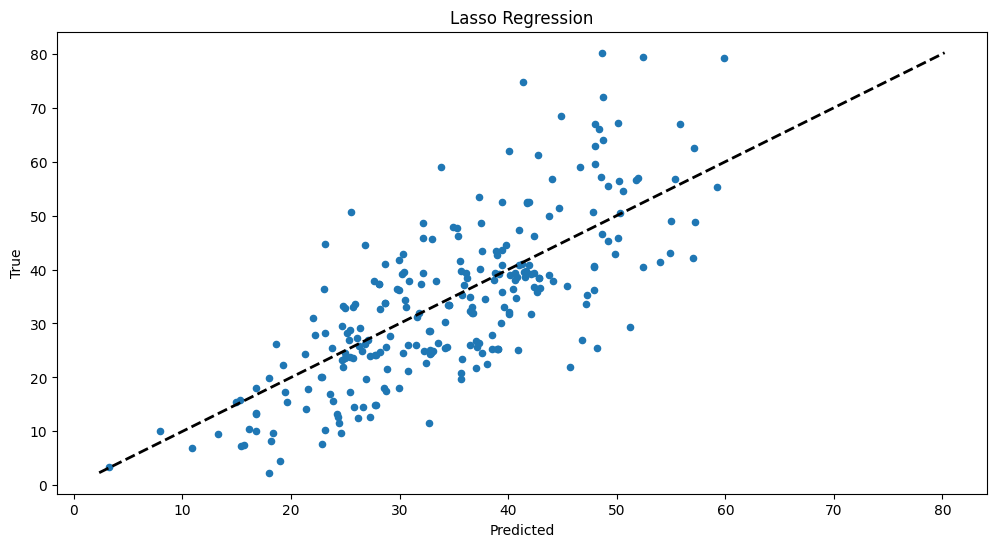

In [73]:
# Plotting the Lasso Regression model actual values vs Predicted values graph
fig, ax1 = plt.subplots(1,1, figsize=(12,6))
ax1.scatter(lasso_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Lasso Regression")

In [74]:
# Summmarizing the lasso regression model evaluation scores
from tabulate import tabulate
my_data = [['R2_Score', "0.55"],
           ['Training Score', lasso_reg_train_score],
           ["Root Mean Square Error", "9.90"],
           ["Mean Square Error", "98.14"],
           ["Mean Absolute Error", "7.87"]
          ]
head = ["Lasso Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+--------------------------------+-----------+
| Lasso Regression Evalauation   |     Score |
+================================+===========+
| R2_Score                       |  0.55     |
+--------------------------------+-----------+
| Training Score                 |  0.633315 |
+--------------------------------+-----------+
| Root Mean Square Error         |  9.9      |
+--------------------------------+-----------+
| Mean Square Error              | 98.14     |
+--------------------------------+-----------+
| Mean Absolute Error            |  7.87     |
+--------------------------------+-----------+


# 3. Ridge Regression

In [75]:
# Importing the library for the Ridge Regression
from sklearn.linear_model import Ridge
ridge_reg = Ridge()

In [76]:
# Training the Ridge regression model.
ridge_reg.fit(X_train, y_train)

Ridge()

In [77]:
# Predicting using test data 
ridge_predict = ridge_reg.predict(X_test)

### Model Evalution

In [78]:
# checking the model accuracy and errors in the model
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error # importing the necessary library
ridge_R2_score = r2_score(y_test, ridge_predict) # checking the accuracy of the model
ridge_R2_score # printing the accuracy

0.598502933100584

In [79]:
ridge_MSE = mean_squared_error(y_test, ridge_predict) # checking the mean squared error of the model
ridge_MSE

93.42695035367895

In [80]:
# Checking the Root mean squared error of the model
ridge_RMSE = np.sqrt(mean_squared_error(y_test, ridge_predict))
ridge_RMSE

9.66576175754808

In [81]:
# checking the mean absolute error of the model
ridge_MAE = mean_absolute_error(y_test, ridge_predict)
ridge_MAE

7.576602842244771

In [82]:
ridge_reg_train_score = ridge_reg.score(X_train, y_train) # Traing score of the ridge regression model 
ridge_reg_train_score

0.6584246526045838

Text(0.5, 1.0, 'Ridge Regression')

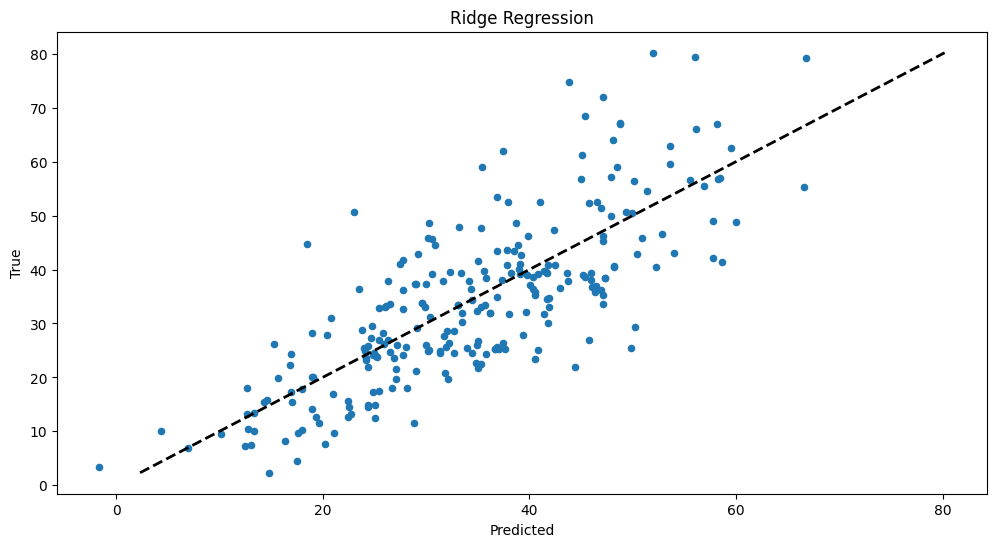

In [83]:
# plotting the graph of the actual vs predicted values 
fig, ax1 = plt.subplots(1,1, figsize=(12,6))
ax1.scatter(ridge_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Ridge Regression")

In [84]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.59"],
           ['Training Score', ridge_reg_train_score],
           ["Root Mean Square Error", "9.43"],
           ["Mean Square Error", "88.94"],
           ["Mean Absolute Error", "7.47"]
          ]
head = ["Ridge Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+--------------------------------+-----------+
| Ridge Regression Evalauation   |     Score |
+================================+===========+
| R2_Score                       |  0.59     |
+--------------------------------+-----------+
| Training Score                 |  0.658425 |
+--------------------------------+-----------+
| Root Mean Square Error         |  9.43     |
+--------------------------------+-----------+
| Mean Square Error              | 88.94     |
+--------------------------------+-----------+
| Mean Absolute Error            |  7.47     |
+--------------------------------+-----------+


# 4. ElasticNet Regression

In [85]:
# Importing the library for the ElasticNet Regression
from sklearn.linear_model import ElasticNet
elasticnet_reg = ElasticNet() # Saving the model into object variable 

In [86]:
elasticnet_reg.fit(X_train, y_train) # training the model using training dataset

ElasticNet()

In [87]:
# predicting using the test dataset
elasticnet_predict = elasticnet_reg.predict(X_test)

### Model Evalution

In [88]:
# Importing the necessary libraries
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
elasticnet_R2_score = r2_score(y_test, elasticnet_predict) # checking the accuracy of the model
elasticnet_R2_score

0.49185352097173896

In [89]:
elasticnet_MSE = mean_squared_error(y_test, elasticnet_predict) # checking the mean squared error of the model 
elasticnet_MSE

118.24389212901409

In [90]:
elasticnet_RMSE = np.sqrt(mean_squared_error(y_test, elasticnet_predict)) # checking the Root mean squared error of the model
elasticnet_RMSE

10.874000741632036

In [91]:
# checking the mean absolute error of the model
elasticnet_MAE = mean_absolute_error(y_test, elasticnet_predict)
elasticnet_MAE

8.663968129730726

In [92]:
elasticnet_reg_train_score = elasticnet_reg.score(X_train, y_train) # training sccuracy of the elastic net regression
elasticnet_reg_train_score

0.5574151872270312

Text(0.5, 1.0, 'ElasticNet Regression')

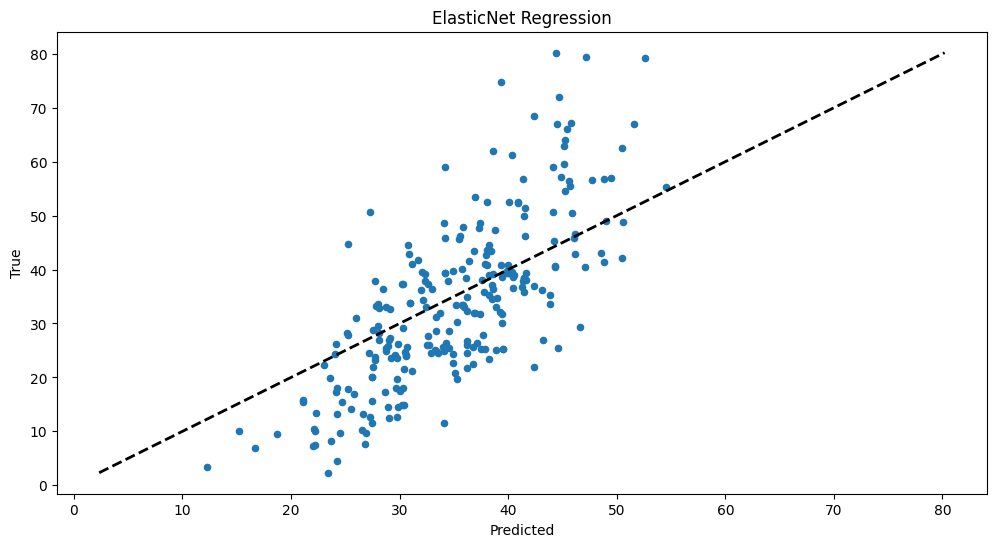

In [93]:
# plotting the graph of actual values vs predicted values of the model
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(elasticnet_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("ElasticNet Regression")

In [94]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.49"],
           ["Training Score", elasticnet_reg_train_score],
           ["Root Mean Square Error", "10.56"],
           ["Mean Square Error", "111.69"],
           ["Mean Absolute Error", "8.34"]
          ]
head = ["Elastic Net Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+--------------------------------------+------------+
| Elastic Net Regression Evalauation   |      Score |
+======================================+============+
| R2_Score                             |   0.49     |
+--------------------------------------+------------+
| Training Score                       |   0.557415 |
+--------------------------------------+------------+
| Root Mean Square Error               |  10.56     |
+--------------------------------------+------------+
| Mean Square Error                    | 111.69     |
+--------------------------------------+------------+
| Mean Absolute Error                  |   8.34     |
+--------------------------------------+------------+


In [95]:
# Summarizing the model evaluation score of the dataset
from tabulate import tabulate
my_data = [['Linear Regression', 8.18, 9.96, 99.32, 0.61, linear_reg_train_score],
           ["Lasso Regression", 7.87, 9.9, 98.14, 0.57, lasso_reg_train_score],
           ["Ridge Regression", 7.47, 9.43, 88.94, 0.61, ridge_reg_train_score],
           ["Elastic Net Regression", 8.47, 10.66, 113.71, 0.51, elasticnet_reg_train_score],
          ]
head = ["Model Name", "MAE", 'RMSE', "MSE", "R2_score", "Training Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+------------------------+-------+--------+--------+------------+------------------+
| Model Name             |   MAE |   RMSE |    MSE |   R2_score |   Training Score |
+========================+=======+========+========+============+==================+
| Linear Regression      |  8.18 |   9.96 |  99.32 |       0.61 |         0.658426 |
+------------------------+-------+--------+--------+------------+------------------+
| Lasso Regression       |  7.87 |   9.9  |  98.14 |       0.57 |         0.633315 |
+------------------------+-------+--------+--------+------------+------------------+
| Ridge Regression       |  7.47 |   9.43 |  88.94 |       0.61 |         0.658425 |
+------------------------+-------+--------+--------+------------+------------------+
| Elastic Net Regression |  8.47 |  10.66 | 113.71 |       0.51 |         0.557415 |
+------------------------+-------+--------+--------+------------+------------------+


##### This condition is called overfitting. It means the model has learned too much from the training data and cannot generalize well to new data. Here we can see all four model are showing over fitting condition

# 5. Decision Tree Regressor

In [96]:
# Importing the necessary libraries 
from sklearn.tree import DecisionTreeRegressor
decisiontree_reg = DecisionTreeRegressor() # saving the model into the object variable

In [97]:
# traing the model using the training dataset
decisiontree_reg.fit(X_train, y_train)

DecisionTreeRegressor()

In [98]:
# predicting the model using testing dataset
decisiontree_reg_predict = decisiontree_reg.predict(X_test)

### Model Evalution

In [99]:
# importing the necessary libraries 
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
decisiontree_reg_R2_score = r2_score(y_test, decisiontree_reg_predict) # checking the accuracy of the model
decisiontree_reg_R2_score

0.6860168108714249

In [100]:
decisiontree_reg_MSE = mean_squared_error(y_test, decisiontree_reg_predict) # checking the mean squared error of the model
decisiontree_reg_MSE

73.06277988315695

In [101]:
decisiontree_reg_RMSE = np.sqrt(mean_squared_error(y_test, decisiontree_reg_predict)) # checking the root mean squared error of the model
decisiontree_reg_RMSE

8.54767687053956

In [102]:
decisiontree_reg_MAE = mean_absolute_error(y_test, decisiontree_reg_predict) # checking the mean absolute error of the model
decisiontree_reg_MAE

5.730138888888889

In [103]:
decisiontree_reg_train_score = decisiontree_reg.score(X_train, y_train) # Training score of the decision tree regression
decisiontree_reg_train_score

0.9953235647551318

Text(0.5, 0.98, 'True vs Predicted')

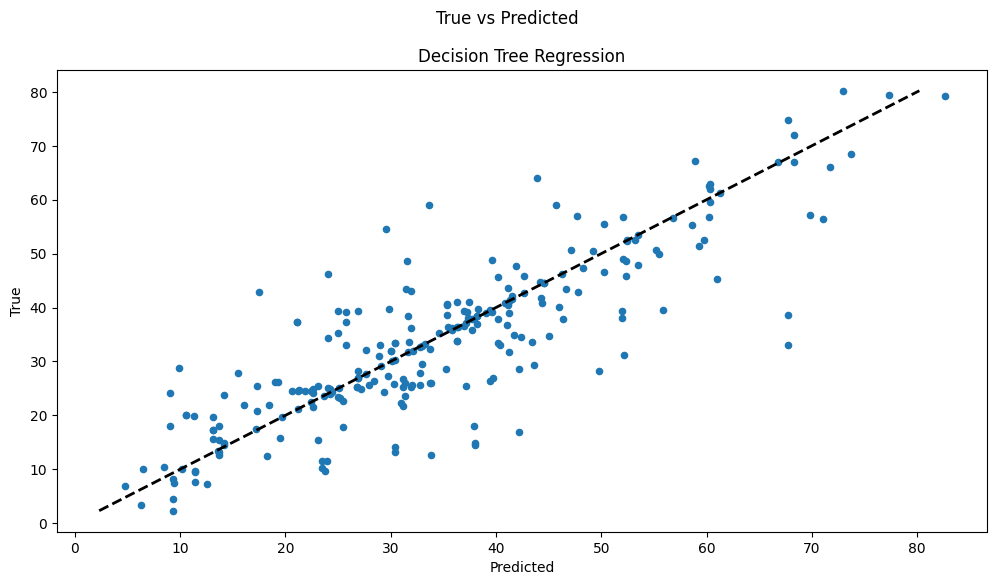

In [104]:
# Plotting the actual vs predicted values 
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(decisiontree_reg_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Decision Tree Regression")
fig.suptitle("True vs Predicted")

In [105]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.69"],
           ['Training score', decisiontree_reg_train_score],
           ["Root Mean Square Error", "8.61"],
           ["Mean Square Error", "74.16"],
           ["Mean Absolute Error", "5.74"]
          ]
head = ["Decision Tree Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+----------------------------------------+-----------+
| Decision Tree Regression Evalauation   |     Score |
+========================================+===========+
| R2_Score                               |  0.69     |
+----------------------------------------+-----------+
| Training score                         |  0.995324 |
+----------------------------------------+-----------+
| Root Mean Square Error                 |  8.61     |
+----------------------------------------+-----------+
| Mean Square Error                      | 74.16     |
+----------------------------------------+-----------+
| Mean Absolute Error                    |  5.74     |
+----------------------------------------+-----------+


# 6. Random Forest Regression

In [106]:
# Importing the necessary libraries 
from sklearn.ensemble import RandomForestRegressor
random_for_reg = RandomForestRegressor(n_estimators=100) # saving the model into object variable

In [107]:
# training the model using training dataset
random_for_reg.fit(X_train, y_train)

RandomForestRegressor()

In [108]:
# predicting using test dataset
random_for_reg_predict = random_for_reg.predict(X_test)

### Model Evalution

In [109]:
# Importing the necessary libraries 
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
random_for_reg_R2_score = r2_score(y_test, random_for_reg_predict) # finding the model accuaracy
random_for_reg_R2_score

0.8271873627488904

In [110]:
random_for_reg_MSE = mean_squared_error(y_test, random_for_reg_predict) # checking the mean squared error of the model 
random_for_reg_MSE

40.212890733252905

In [111]:
# Finding the root mean squared error of the model
random_for_reg_RMSE = np.sqrt(mean_squared_error(y_test, random_for_reg_predict))
random_for_reg_RMSE

6.34136347588221

In [112]:
# finding the mean absolute error of the model 
random_for_reg_MAE = mean_absolute_error(y_test, random_for_reg_predict)
random_for_reg_MAE

4.79100073554422

In [113]:
random_for_reg_train_score = random_for_reg.score(X_train, y_train) # Training score of ranom forest regression
random_for_reg_train_score

0.9724454643860889

Text(0.5, 0.98, 'True vs Predicted')

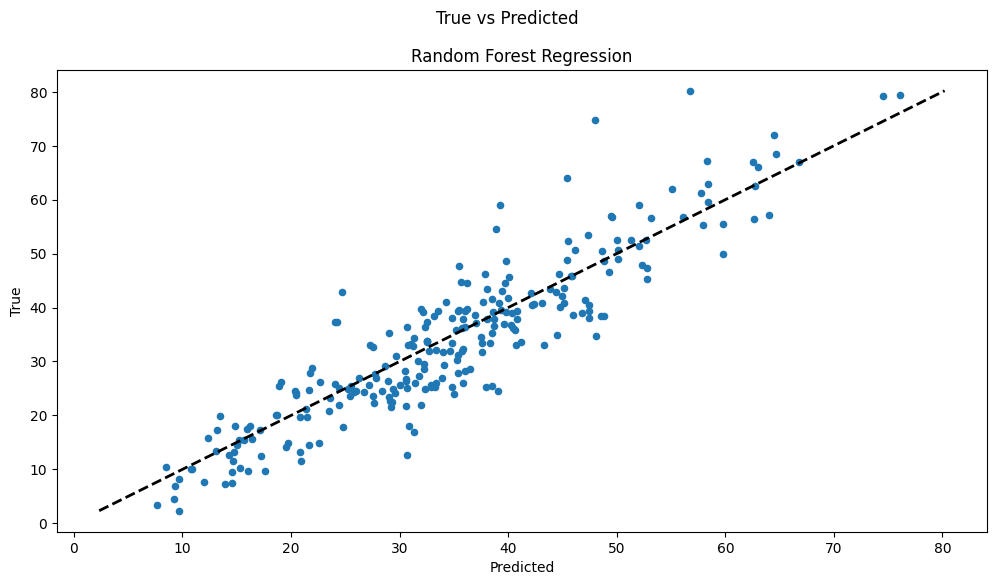

In [114]:
# Plotting the actual vs predicted values 
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(random_for_reg_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Random Forest Regression")
fig.suptitle("True vs Predicted")

In [115]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.83"],
           ["Root Mean Square Error", "6.47"],
           ["Mean Square Error", "41.98"],
           ["Mean Absolute Error", "4.85"]
          ]
head = ["Random Forest Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+-----------------------------+---------+
| Random Forest Evalauation   |   Score |
+=============================+=========+
| R2_Score                    |    0.83 |
+-----------------------------+---------+
| Root Mean Square Error      |    6.47 |
+-----------------------------+---------+
| Mean Square Error           |   41.98 |
+-----------------------------+---------+
| Mean Absolute Error         |    4.85 |
+-----------------------------+---------+


# 7. Support Vector Regression

In [116]:
# Importing the necessary libraires 
from sklearn.svm import SVR
support_Vector_Regressor = SVR() # saving the mdoel into object variable 

In [117]:
support_Vector_Regressor.fit(X_train, y_train) # training the model using training dataset

SVR()

In [118]:
support_Vector_Regressor_predict = support_Vector_Regressor.predict(X_test) # predicting using test dataset

### Model Evaluation

In [119]:
# Importing necessary libraires 
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
support_Vector_Regressor_R2_score = r2_score(y_test, support_Vector_Regressor_predict) # Finding the accuracy score of the dataset
support_Vector_Regressor_R2_score

0.5984867216268295

In [120]:
support_Vector_Regressor_MSE = mean_squared_error(y_test, support_Vector_Regressor_predict) # checking the mean squared error of the dataset
support_Vector_Regressor_MSE

93.430722706402

In [121]:
support_Vector_Regressor_MAE = mean_absolute_error(y_test, support_Vector_Regressor_predict) # checking the mean absolute error of the dataset
support_Vector_Regressor_MAE

7.252536793023914

In [122]:
support_Vector_Regressor_RSME = np.sqrt(mean_absolute_error(y_test, support_Vector_Regressor_predict)) # checking the rooot mean squared error of the dataset
support_Vector_Regressor_RSME

2.6930534330057236

In [123]:
# training score of support vector regression
support_Vector_Regressor_training_score = support_Vector_Regressor.score(X_train, y_train) 
support_Vector_Regressor_training_score

0.6265417463529686

Text(0.5, 0.98, 'True vs Predicted')

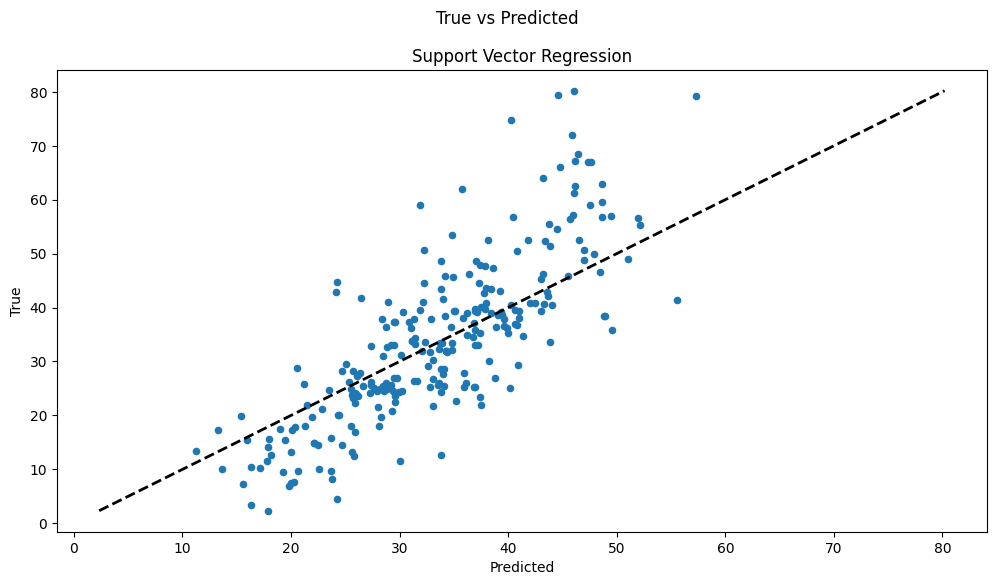

In [124]:
# Plotting the graph b/w actual vs predicted values 
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(support_Vector_Regressor_predict, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Support Vector Regression")
fig.suptitle("True vs Predicted")

In [125]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.59"],
           ["Training Score", support_Vector_Regressor_training_score],
           ["Root Mean Square Error", "3.11"],
           ["Mean Square Error", "151.68"],
           ["Mean Absolute Error", "9.68"]
          ]
head = ["Support Vector Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+-----------------------------------------+------------+
| Support Vector Regression Evalauation   |      Score |
+=========================================+============+
| R2_Score                                |   0.59     |
+-----------------------------------------+------------+
| Training Score                          |   0.626542 |
+-----------------------------------------+------------+
| Root Mean Square Error                  |   3.11     |
+-----------------------------------------+------------+
| Mean Square Error                       | 151.68     |
+-----------------------------------------+------------+
| Mean Absolute Error                     |   9.68     |
+-----------------------------------------+------------+


# 8. K-Neighbors Regression

In [126]:
# Importing the Necessary libraries
from sklearn.neighbors import KNeighborsRegressor
# saving the model into object variable
K_Neighbors_Regressor = KNeighborsRegressor()
K_Neighbors_Regressor.fit(X_train, y_train) # training the model with training dataset

KNeighborsRegressor()

In [127]:
K_Neighbors_Regressor_prediction = K_Neighbors_Regressor.predict(X_test) # predicting the model using test data

### Model Evaluation

In [128]:
# Checking the model accuracy
K_Neighbors_Regressor_R2_Score = r2_score(y_test, K_Neighbors_Regressor_prediction)
K_Neighbors_Regressor_R2_Score 

0.6907822844565176

In [129]:
# finding the mean sqaured error of the model 
K_Neighbors_Regressor_MSE = mean_squared_error(y_test, K_Neighbors_Regressor_prediction)
K_Neighbors_Regressor_MSE

71.95387099999999

In [130]:
# checking the  root mean sqaured error of the model 
K_Neighbors_Regressor_RMSE = np.sqrt(mean_squared_error(y_test, K_Neighbors_Regressor_prediction))
K_Neighbors_Regressor_RMSE

8.48256276133575

In [131]:
# checking the mean absolute error of the model 
K_Neighbors_Regressor_MAE = mean_absolute_error(y_test, K_Neighbors_Regressor_prediction)
K_Neighbors_Regressor_MAE

6.495531746031747

In [132]:
# Training score of the K Neighbour Regression
K_Neighbors_Regressor_training_score = K_Neighbors_Regressor.score(X_train, y_train)
K_Neighbors_Regressor_training_score

0.8177557574798925

Text(0.5, 0.98, 'True vs Predicted')

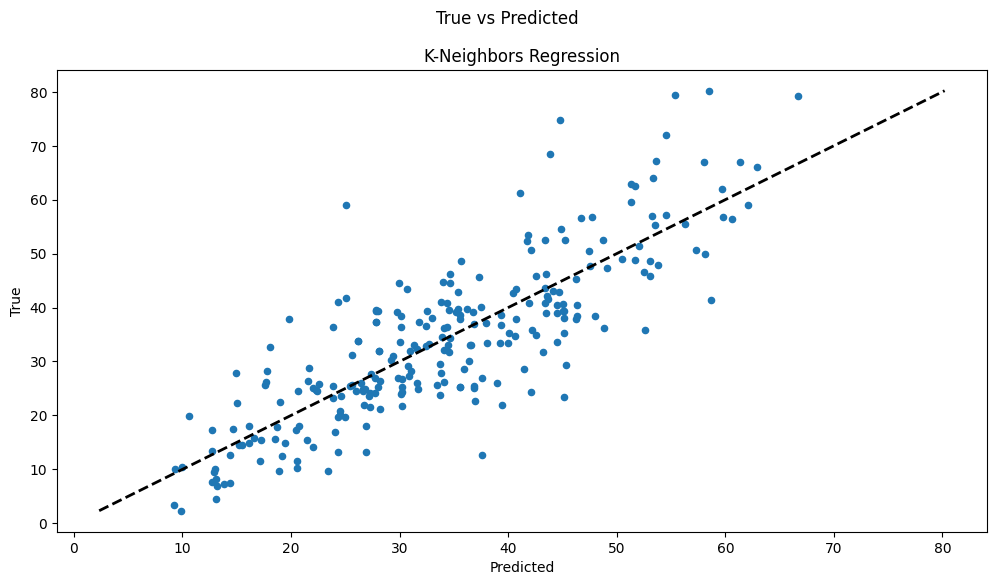

In [133]:
# plotting the graph b/w the actual vs predicted values
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(K_Neighbors_Regressor_prediction, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("K-Neighbors Regression")
fig.suptitle("True vs Predicted")

In [134]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.69"],
           ["Training Score", K_Neighbors_Regressor_training_score],
           ["Root Mean Square Error", "8.98"],
           ["Mean Square Error", "79.35"],
           ["Mean Absolute Error", "6.84"]
          ]
head = ["K-Neighbour Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+--------------------------------------+-----------+
| K-Neighbour Regression Evalauation   |     Score |
+======================================+===========+
| R2_Score                             |  0.69     |
+--------------------------------------+-----------+
| Training Score                       |  0.817756 |
+--------------------------------------+-----------+
| Root Mean Square Error               |  8.98     |
+--------------------------------------+-----------+
| Mean Square Error                    | 79.35     |
+--------------------------------------+-----------+
| Mean Absolute Error                  |  6.84     |
+--------------------------------------+-----------+


# 9. Ada Boost Regression

In [135]:
# importing the library and saving the model 
from sklearn.ensemble import AdaBoostRegressor
adaboost_reg = AdaBoostRegressor()
adaboost_reg.fit(X_train, y_train) # training the dataset using training data

AdaBoostRegressor()

In [136]:
# predicting the model using 
adaboost_reg_prediction = adaboost_reg.predict(X_test)

### Model Evaluation

In [137]:
# Checking the accuracy of the model
adaboost_reg_R2_Score = r2_score(y_test, adaboost_reg_prediction)
adaboost_reg_R2_Score 

0.6005421950959602

In [138]:
# checking the mean squared error of the dataset
adaboost_reg_MSE = mean_squared_error(y_test, adaboost_reg_prediction)
adaboost_reg_MSE

92.95242128508208

In [139]:
# Checking the root mean squared error 
adaboost_reg_RMSE = np.sqrt(mean_squared_error(y_test, adaboost_reg_prediction))
adaboost_reg_RMSE

9.641183603950402

In [140]:
# checking the mean absolute error 
adaboost_reg_MAE = mean_absolute_error(y_test, adaboost_reg_prediction)
adaboost_reg_MAE

7.9881812996898

In [141]:
adaboost_reg_training_score = adaboost_reg.score(X_train, y_train) # Training score or adboost regressor
adaboost_reg_training_score

0.7274676303717788

Text(0.5, 0.98, 'True vs Predicted')

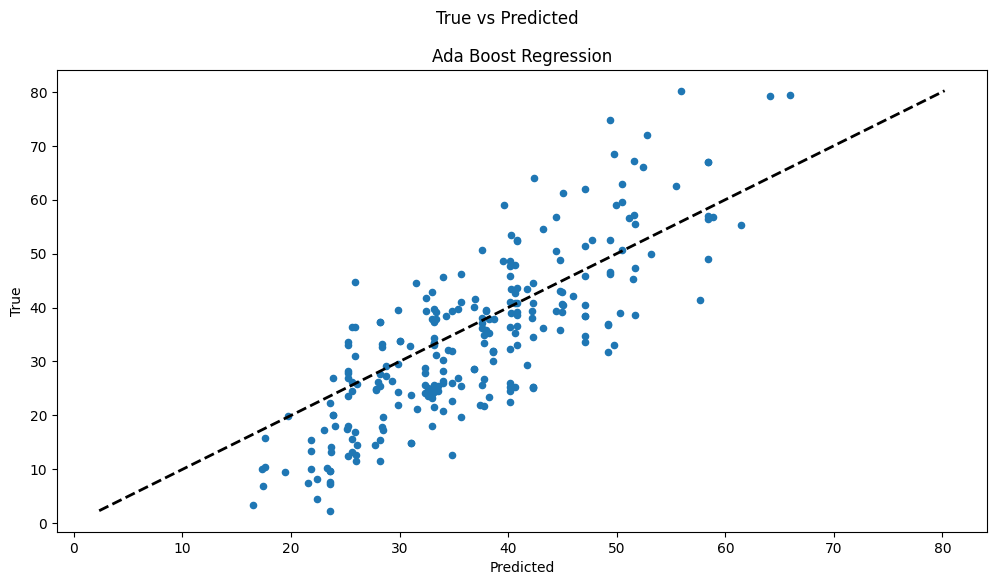

In [142]:
# plotting the graphs b/w actual vs predicted values
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(adaboost_reg_prediction, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Ada Boost Regression")
fig.suptitle("True vs Predicted")

In [143]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.60"],
           ["Training Score", adaboost_reg_training_score],
           ["Root Mean Square Error", "91.91"],
           ["Mean Square Error", "9.58"],
           ["Mean Absolute Error", "7.88"]
          ]
head = ["Adaboost Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+-----------------------------------+-----------+
| Adaboost Regression Evalauation   |     Score |
+===================================+===========+
| R2_Score                          |  0.6      |
+-----------------------------------+-----------+
| Training Score                    |  0.727468 |
+-----------------------------------+-----------+
| Root Mean Square Error            | 91.91     |
+-----------------------------------+-----------+
| Mean Square Error                 |  9.58     |
+-----------------------------------+-----------+
| Mean Absolute Error               |  7.88     |
+-----------------------------------+-----------+


# 10. Gradient Boosting Regression

In [144]:
# Importing the libraries
from sklearn.ensemble import GradientBoostingRegressor
gradient_boost_reg = GradientBoostingRegressor() # saving the model into the object variable

In [145]:
gradient_boost_reg.fit(X_train, y_train) # training our model using train dataset

GradientBoostingRegressor()

In [146]:
# prediction using the testing data
gradient_boost_reg_prediction = gradient_boost_reg.predict(X_test)

### Model Evaluation

In [147]:
# checking the accuracy of the model
gradient_boost_reg_R2_Score = r2_score(y_test, gradient_boost_reg_prediction)
gradient_boost_reg_R2_Score

0.7939642219840701

In [148]:
# Finding the mean squared error
gradient_boost_reg_MSE = mean_squared_error(y_test, gradient_boost_reg_prediction)
gradient_boost_reg_MSE

47.94379832567563

In [149]:
# Finding the root saured error 
gradient_boost_reg_RMSE = np.sqrt(mean_squared_error(y_test, gradient_boost_reg_prediction))
gradient_boost_reg_RMSE

6.924146035842661

In [150]:
# finding the mean absolute error
gradient_boost_reg_MAE = mean_absolute_error(y_test, gradient_boost_reg_prediction)
gradient_boost_reg_MAE

5.295899111035618

In [151]:
gradient_boost_reg_train_score = gradient_boost_reg.score(X_train, y_train) # Training score of the gradient boosting regression
gradient_boost_reg_train_score

0.8925707046521416

Text(0.5, 0.98, 'True vs Predicted')

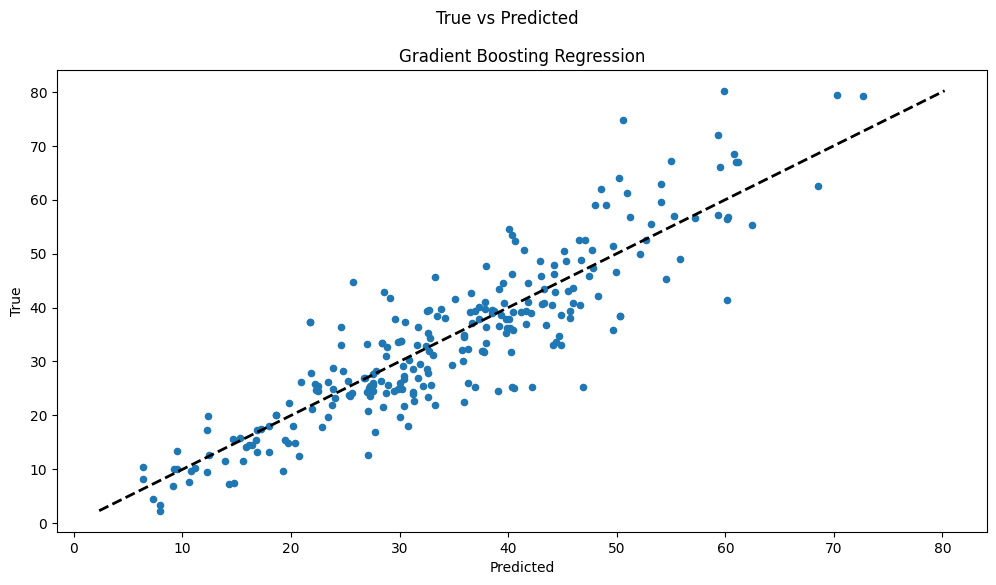

In [152]:
# Plotting the graph b/w the acyual and predicted values
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(gradient_boost_reg_prediction, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("Gradient Boosting Regression")
fig.suptitle("True vs Predicted")

In [153]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.79"],
           ["Training Score", gradient_boost_reg_train_score],
           ["Root Mean Square Error", "48.05"],
           ["Mean Square Error", "6.93"],
           ["Mean Absolute Error", "5.29"]
          ]
head = ["Gradient Boosting Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+--------------------------------------------+-----------+
| Gradient Boosting Regression Evalauation   |     Score |
+============================================+===========+
| R2_Score                                   |  0.79     |
+--------------------------------------------+-----------+
| Training Score                             |  0.892571 |
+--------------------------------------------+-----------+
| Root Mean Square Error                     | 48.05     |
+--------------------------------------------+-----------+
| Mean Square Error                          |  6.93     |
+--------------------------------------------+-----------+
| Mean Absolute Error                        |  5.29     |
+--------------------------------------------+-----------+


# 11. XGBoost Regression

In [154]:
# importing the libraries
# use this code for installing the XGboosst library
# pip install xgboost
from xgboost import XGBRegressor
xgboost_reg = XGBRegressor() # saving the model in object variable

In [155]:
xgboost_reg.fit(X_train, y_train) # Traning our model using training data

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [156]:
# prediciting using testing data
xgboost_reg_prediction = xgboost_reg.predict(X_test)

#### Model Evaluation

In [157]:
# finding the accuracy of the model
xgboost_reg_R2_Score = r2_score(y_test, xgboost_reg_prediction)
xgboost_reg_R2_Score

0.8830310436548691

In [158]:
# Finding the mean squared error 
xgboost_reg_MSE = mean_squared_error(y_test, xgboost_reg_prediction)
xgboost_reg_MSE

27.218263290864602

In [159]:
# Finding the root squared error 
xgboost_reg_RMSE = np.sqrt(mean_squared_error(y_test, xgboost_reg_prediction))
xgboost_reg_RMSE

5.217112543434788

In [160]:
# finding the mean absolute error
xgboost_reg_MAE = mean_absolute_error(y_test, xgboost_reg_prediction)
xgboost_reg_MAE

3.827605073527684

In [161]:
xgboost_reg_train_score = xgboost_reg.score(X_train, y_train) # Training Score of the xgboost regression
xgboost_reg_train_score

0.9941554933197907

Text(0.5, 0.98, 'True vs Predicted')

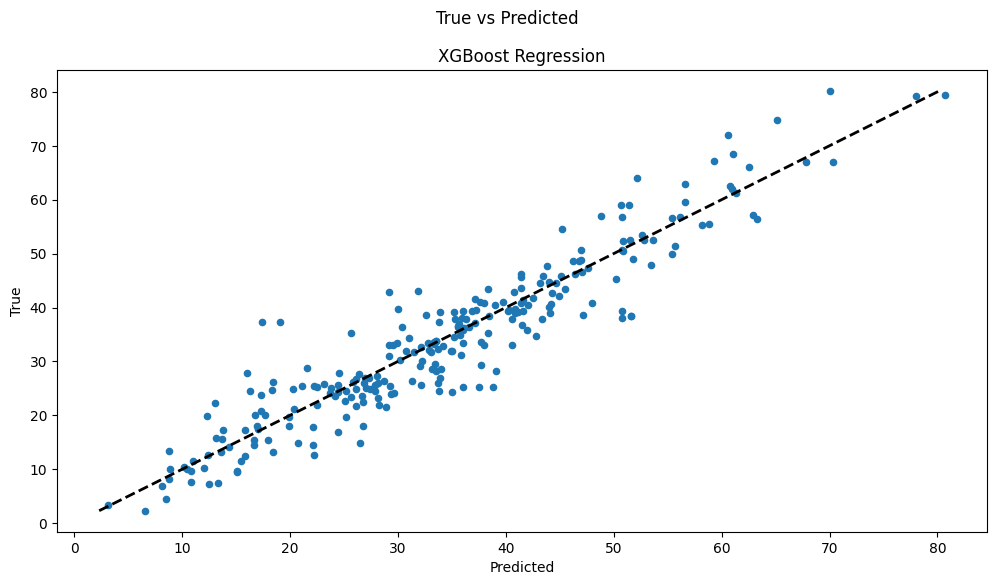

In [162]:
# Plotting the graph b/w the actial and the predicted values
fig, ax1 = plt.subplots(1,1, figsize=(12,6))

ax1.scatter(xgboost_reg_prediction, y_test, s=20)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
ax1.set_ylabel("True")
ax1.set_xlabel("Predicted")
ax1.set_title("XGBoost Regression")
fig.suptitle("True vs Predicted")

In [163]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['R2_Score', "0.88"],
           ["Root Mean Square Error", "27.23"],
           ["Mean Square Error", "5.21"],
           ["Mean Absolute Error", "3.83"]
          ]
head = ["XGBoost Regression Evalauation", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+----------------------------------+---------+
| XGBoost Regression Evalauation   |   Score |
+==================================+=========+
| R2_Score                         |    0.88 |
+----------------------------------+---------+
| Root Mean Square Error           |   27.23 |
+----------------------------------+---------+
| Mean Square Error                |    5.21 |
+----------------------------------+---------+
| Mean Absolute Error              |    3.83 |
+----------------------------------+---------+


In [164]:
# Summarizing the accuracy of all algorithm and finding the best model which have highest accuracy score after doing the Hyper Paramater tuning
from tabulate import tabulate
my_data = [['Linear Regression', 8.18, 9.96, 99.32, 0.61, linear_reg_train_score],
           ["Lasso Regression", 7.87, 9.9, 98.14, 0.57, lasso_reg_train_score],
           ["Ridge Regression", 7.47, 9.43, 88.94, 0.61, ridge_reg_train_score],
           ["Elastic Net Regression", 8.47, 10.66, 113.71, 0.51, elasticnet_reg_train_score],
           ["Decision Tree Regression", 5.63, 8.39, 70.39, 0.69, decisiontree_reg_train_score],
           ["Random Forest Regression", 4.83, 6.36, 40.47, 0.82, random_for_reg_train_score],
           ["Support Vector Regression", 2.68, 7.22, 93.48, 0.59, support_Vector_Regressor_training_score],
           ["K-Neighbour Regression", 6.32, 8.26, 68.36, .70, K_Neighbors_Regressor_training_score],
           ["Adaboost Regression", 8.11, 9.74, 95.00, 0.59, adaboost_reg_training_score],
           ["Gradient Boosting", 5.29, 6.91, 47.84, 0.79, gradient_boost_reg_train_score],
           ["Xgboost Regression", 3.83, 5.22, 27.27, 0.88, xgboost_reg_train_score]
          ]
head = ["Model Name", "MAE", 'RMSE', "MSE", "R2_score", "Training Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+---------------------------+-------+--------+--------+------------+------------------+
| Model Name                |   MAE |   RMSE |    MSE |   R2_score |   Training Score |
+===========================+=======+========+========+============+==================+
| Linear Regression         |  8.18 |   9.96 |  99.32 |       0.61 |         0.658426 |
+---------------------------+-------+--------+--------+------------+------------------+
| Lasso Regression          |  7.87 |   9.9  |  98.14 |       0.57 |         0.633315 |
+---------------------------+-------+--------+--------+------------+------------------+
| Ridge Regression          |  7.47 |   9.43 |  88.94 |       0.61 |         0.658425 |
+---------------------------+-------+--------+--------+------------+------------------+
| Elastic Net Regression    |  8.47 |  10.66 | 113.71 |       0.51 |         0.557415 |
+---------------------------+-------+--------+--------+------------+------------------+
| Decision Tree Regression  |  5

#### We can see that we that we have two two ML Algorithm Descision tree and Xgboost Regression having higher R2_Score (accuracy score) and having very less Root Square mean error (which mean model contains very less amount of error while predicting the values)

#### Now we can say that we can do a hyperparameter tuning on these two algorithm to check whether we can improve the accuracy on these algorithm

# Hyperparamter Tuning

## XGBoost Regressor

In [165]:
# importing the necessary Libraries
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV

In [166]:
# saving the model into the object variable
xgboost_reg_hyp_tuning = XGBRegressor()

In [167]:
# Giving random paramter to the model for choosing best parameters
params = {
          'learning_rate': [0.1,0.2,0.5,0.8,1],
          'max_depth': [2,3,4,5,6,7,8,10],
          'subsample': [0.001,0.009,0.01,0.09,0.1,0.4,0.9,1],
          'min_child_weight': [1,2,4,5,8],
          'gamma': [0.0,0.1,0.2,0.3],
          'colsample_bytree': [0.3,0.5,0.7,1.0,1.4],
          'reg_alpha': [0,0.1,0.2,0.4,0.5,0.7,0.9,1,4,8,10,50,100],
          'reg_lambda': [1,4,5,10,20,50,100,200,500,800,1000]
          
         }

In [168]:
#Using Randomized search cv training our model
xgboost_rand_searchCV = RandomizedSearchCV(estimator=xgboost_reg_hyp_tuning, param_distributions=params, n_iter = 10, 
                                scoring='r2', cv = 20, verbose=2, 
                                random_state=42, n_jobs=-1, return_train_score=True)
xgboost_rand_searchCV.fit(X_train, y_train)

Fitting 20 folds for each of 10 candidates, totalling 200 fits


RandomizedSearchCV(cv=20,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate...
                                                             1.4],
                                        'gamma': [0.0, 0.1, 0.2, 0.3],
                                        'learning_rate': [0.1, 0.2, 0.5, 0.8,
                                                          1],
                                        'max_depth': [2, 3, 4, 5, 6, 7, 8, 10],
                                        'min_child_weight': [1, 2, 4, 5, 8],
                                        'reg_alpha': [0, 0.1, 0.2, 0.4, 0.5,
                                                      0.7, 0.9, 1, 4, 8, 10, 50,
                                                      100],
                                        'reg_lambda': [1, 4, 5, 10, 20, 50, 100,
                                                       200, 500, 800, 1000],
                                        'subsample': [0.001, 0.009, 0.01, 0.09,
                                                      0.1, 0.4, 0.9, 1]},
                   random_state=42, return_train_score=True, scoring='r2',
                   verbose=2)

In [169]:
# The best estimator on which our model performs best
xgboost_rand_searchCV.best_estimator_ 

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.2, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=4, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [170]:
# Best paramters on which our model performs best
xgboost_rand_searchCV.best_params_

{'subsample': 0.9,
 'reg_lambda': 1000,
 'reg_alpha': 0.5,
 'min_child_weight': 4,
 'max_depth': 4,
 'learning_rate': 1,
 'gamma': 0.2,
 'colsample_bytree': 0.5}

In [171]:
# The Best accuracy we get after the Hyper Parameter Tuning 
xgboost_rand_searchCV.best_score_

0.8089631901697562

### Here after hyper paramter tuning we can see that our xgboost model accuracy score decreases, from this we can inference that the previously while training our model it faces a  overfitting condition. Due to which after tuning the model it accuracy score decreased.

## Random Forest Regression Hyperparameter Tuning

In [172]:
# Importing the necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

In [173]:
# instantiating random forest regressor
random_for_hyp_tuning = RandomForestRegressor()

In [174]:
#using Randomized Search CV for hyper parameter tuning
params = {'n_estimators':[5,10,20,40,80,100,200],
          'criterion':['friedman_mse', 'absolute_error', 'squared_error', 'poisson'],
          'max_depth':[2,5,10,20],
          'min_samples_split':[2,4,8,12],
          'min_samples_leaf':[2,4,6,8,10],
          'oob_score': [True]}

In [175]:
# training our model with given paramters 
rand_for_searchCV = RandomizedSearchCV(estimator = random_for_hyp_tuning, param_distributions = params, n_iter = 10, scoring = 'r2', cv = 10, verbose=5, 
                                random_state=42, n_jobs=-1, return_train_score=True)
rand_for_searchCV.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'criterion': ['friedman_mse',
                                                      'absolute_error',
                                                      'squared_error',
                                                      'poisson'],
                                        'max_depth': [2, 5, 10, 20],
                                        'min_samples_leaf': [2, 4, 6, 8, 10],
                                        'min_samples_split': [2, 4, 8, 12],
                                        'n_estimators': [5, 10, 20, 40, 80, 100,
                                                         200],
                                        'oob_score': [True]},
                   random_state=42, return_train_score=True, scoring='r2',
                   verbose=5)

In [176]:
# The best Parameter which model has choosen after hyper parameter tuning
rand_for_searchCV.best_params_

{'oob_score': True,
 'n_estimators': 80,
 'min_samples_split': 8,
 'min_samples_leaf': 4,
 'max_depth': 20,
 'criterion': 'friedman_mse'}

In [177]:
# best accuracy score we get after Hyper Parameter Tuning
rand_for_searchCV.best_score_


0.7757812399675451

In [178]:
# Best estimator for model which has chosen after Hyper paraMeter Tuning
rand_for_searchCV.best_estimator_

RandomForestRegressor(criterion='friedman_mse', max_depth=20,
                      min_samples_leaf=4, min_samples_split=8, n_estimators=80,
                      oob_score=True)

## Gradient Boosting Regression

In [179]:
# Importing the libraries
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV

In [180]:
# Iniintiating the Gradient Descent regressor
gradient_boost_hyp_tuning = GradientBoostingRegressor()

In [181]:
# Randomly giving the paramter so that model has to choose which one is the best parameter 
params = {'n_estimators':[5,10,20,40,80,100,200],
          'learning_rate':[0.1,0.2,0.5,0.8,1],
          'loss':['lr','lad','huber'],
          'subsample':[0.001,0.009,0.01,0.09,0.1,0.4,0.9,1],
          'criterion':['friedman_mse', 'squared_error'],
          'min_samples_split':[2,4,8,10],
          'min_samples_leaf':[1,10,20,50]
         }

In [182]:
#randomized search cv using given parameters
gradient_searchCV = RandomizedSearchCV(estimator = gradient_boost_hyp_tuning, param_distributions = params, n_iter = 10, scoring = 'r2', n_jobs = -1,
                         cv = 10, verbose = 5, random_state = 42, return_train_score = True)

gradient_searchCV.fit(X_train,y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error'],
                                        'learning_rate': [0.1, 0.2, 0.5, 0.8,
                                                          1],
                                        'loss': ['lr', 'lad', 'huber'],
                                        'min_samples_leaf': [1, 10, 20, 50],
                                        'min_samples_split': [2, 4, 8, 10],
                                        'n_estimators': [5, 10, 20, 40, 80, 100,
                                                         200],
                                        'subsample': [0.001, 0.009, 0.01, 0.09,
                                                      0.1, 0.4, 0.9, 1]},
                   random_state=42, return_train_score=True, scoring='r2',
                   verbose=5)

In [183]:
# The best estimator model has choosen
gradient_searchCV.best_estimator_

GradientBoostingRegressor(criterion='squared_error', learning_rate=0.8,
                          loss='huber', min_samples_leaf=10,
                          min_samples_split=8, n_estimators=20, subsample=0.9)

In [184]:
# best parameters model has choosen
gradient_searchCV.best_params_

{'subsample': 0.9,
 'n_estimators': 20,
 'min_samples_split': 8,
 'min_samples_leaf': 10,
 'loss': 'huber',
 'learning_rate': 0.8,
 'criterion': 'squared_error'}

In [185]:
# best score accuracy score we get after traning our model with Hyper Parameter Tuning
gradient_searchCV.best_score_

0.7608295767654736

In [186]:
# summarizing the evalution scores of the model
from tabulate import tabulate
my_data = [['XGBoost Regression', xgboost_rand_searchCV.best_score_],
           ["Random Forest Regression", rand_for_searchCV.best_score_],
           ["Gradient Boosting Regression", gradient_searchCV.best_score_],
           
          ]
head = ["Model name after HyperParameter Tuning", "Score"]
print(tabulate(my_data, headers=head, tablefmt="grid"))

+------------------------------------------+----------+
| Model name after HyperParameter Tuning   |    Score |
+==========================================+==========+
| XGBoost Regression                       | 0.808963 |
+------------------------------------------+----------+
| Random Forest Regression                 | 0.775781 |
+------------------------------------------+----------+
| Gradient Boosting Regression             | 0.76083  |
+------------------------------------------+----------+


# CONCLUSION

#### In this Project we have to predict the future strength of a concrete mix, based on its constituents’ composition and also the age of the mix.

#### So, while we doing Exploratory data Analysis We found that there are lots of duplicated datatpoints are present in the dataset so we have to remove that duplicated datapoints from the dataset.

#### Also while doing EDA we found that there lot of outliers are present in the dataset. So for removing the outliers we have made a function in which it uses IQR method to remove outliers. In this method the datapoints which are present in the upper boundry limit and lower boundry limit considered as the outliers. So, inplace of that datapoint which are considered as outliers we imputed it as Median values of that particular feature columns.

#### After imputing the median values to the outliers we found that our feature column ditribution is skewed in nature. So we need to improve the distribution. After checking the distribution we have found that there are lots of zeroes values are present in the feature columns like slag, ash, superplstic. So we have to impute any values instead of zeroes, for which we have used KNN Imputer instead of imputing the median value beacause if we used median values as imputation our result will biased toward the median values. Again For improving our distribution we have used log transformation of all the independent features. And hence we found that our distribution improved somewhat to the gaussian distribution. 

#### Even after transforming the dataset into log tranformation our dataset didnt need any data scaling. But for precaution we have used data scaling for the dataset. so that even if there is biasness occured due to the higher range of values present in the two different features columns does not impact our result.

#### In Model Creation we have used different types of regression model and checked different evealution metrics. We have checked listed ML algorithms and checked performance of model that out of these algorithms which model is performing better.
    - Linear Regression
    - Ridge Regression
    - Lasso Regression
    - ElasticNet Regression
    - Support Vector Regression
    - Descision Tree regression
    - Random Forest Regression
    - K- Neighbour Reression
    - XGBoosting Regression
    - Gradient Boosting Regression
    - Adaboost Regression

### Out Of these algorithms top three model which performed better than other algorithm are:
    - Gradient Boosting Regression
    - XGBoosting Regression
    - Descision Tree Regression

## After doing the Hyper Parameter Tuning we found that XGBoosting Regression Model performed better that all algorithms we have choosen for the  the predicting the the future strength of a concrete mix, based on its constituents’ composition and also the age of the mix. 

-----------------------------------------------------------------------

# So we have choosen the XGBoost Regression model as for production to predict the the future strength of a concrete mix, based on its constituents’ composition and also the age of the mix.

---------------------------------------------------------